In [154]:
import pyarrow.csv as pv
import pyarrow.parquet as pq
import pyarrow.compute as pc
import pyarrow as pa
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from folium.plugins import HeatMap
import folium
import geopandas as gpd
from folium import plugins
from branca.colormap import linear
from folium.plugins import MarkerCluster
import json
import geobr
import numpy as np
from shapely.geometry import Point
import statsmodels.api as sm
import contextily as ctx
import scipy.stats as stats
import scipy.stats as pearsonr
import matplotlib.dates as mdate
from mpl_toolkits.axes_grid1 import make_axes_locatable
from tabulate import tabulate  
from scipy.stats import linregress

## Carregamento

In [13]:
df = pd.read_csv("deng-municipio_2.csv")
df2 =  pd.read_csv("deng-municipio.csv")
clima = pd.read_csv("dados_climaticos.csv")

<Axes: >

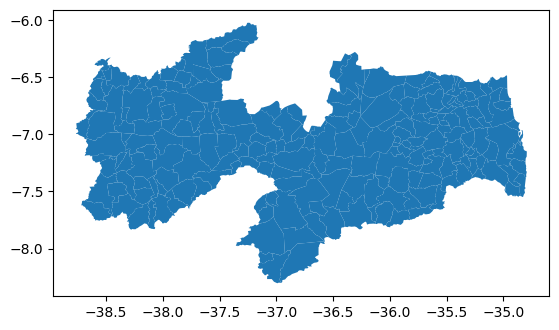

In [2]:
geojson = gpd.read_file("https://raw.githubusercontent.com/tbrugz/geodata-br/refs/heads/master/geojson/geojs-25-mun.json")
geojson.plot()

In [2]:
# dengue_teste =  pv.read_csv("deng-municipio.csv")

clima = pv.read_csv("dados_climaticos.csv")
dengue = pv.read_csv("deng-municipio_2.csv")

In [3]:
df_mensal =  pd.read_csv("dados_pb_clima_dengue.csv")

In [3]:
df_dengue = dengue.to_pandas()
df_clima = clima.to_pandas()

## Tratamento

In [4]:
inicio = "2000-01-01"
fim = "2023-12-31"

In [6]:
df_clima["Data"] = pd.to_datetime(df_clima["Data"])
df_dengue["data"] = pd.to_datetime(df_dengue["data"], dayfirst=True)

In [7]:
df_clima = df_clima[(df_clima["Data"] >= inicio) & (df_clima["Data"] <= fim)]
df_dengue = df_dengue[(df_dengue["data"] >= inicio) & (df_dengue["data"] <= fim)]

In [8]:
df_clima.loc[:, 'ano_clima'] = df_clima['Data'].dt.year
df_dengue.loc[:, 'ano_casos'] = df_dengue['data'].dt.year

In [9]:
df_clima = df_clima[df_clima.NM_UF=='Paraíba'].copy()

In [10]:
df_clima

,CD_MUN,Data,NM_MUN,CD_RGI,NM_RGI,CD_RGINT,NM_RGINT,CD_UF,NM_UF,CD_REGIAO,NM_REGIAO,CD_CONCURB,NM_CONCURB,AREA_KM2,longitude,latitude,temperatura_max_C,temperatura_min_C,precipitacao_acumulada,ano_clima
2608938,2500106,2000-01-31,Água Branca,250009.0,Patos,2503.0,Patos,25.0,Paraíba,2.0,Nordeste,NaN,,241.662,-37.662622,-7.470488,30,20,89,2000
2608939,2500205,2000-01-31,Aguiar,250010.0,Itaporanga,2503.0,Patos,25.0,Paraíba,2.0,Nordeste,NaN,,351.607,-38.213779,-7.074082,31,21,128,2000
2608940,2500304,2000-01-31,Alagoa Grande,250005.0,Campina Grande,2502.0,Campina Grande,25.0,Paraíba,2.0,Nordeste,NaN,,322.071,-35.602842,-7.059072,30,22,87,2000
2608941,2500403,2000-01-31,Alagoa Nova,250005.0,Campina Grande,2502.0,Campina Grande,25.0,Paraíba,2.0,Nordeste,NaN,,128.230,-35.766917,-7.061643,28,20,87,2000
2608942,2500502,2000-01-31,Alagoinha,250002.0,Guarabira,2501.0,João Pessoa,25.0,Paraíba,2.0,Nordeste,NaN,,111.361,-35.522214,-6.961968,30,22,84,2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4208320,2516904,2023-12-31,Uiraúna,250014.0,Sousa,2504.0,Sousa - Cajazeiras,25.0,Paraíba,2.0,Nordeste,NaN,,293.182,-38.391638,-6.510847,35,22,36,2023
4208321,2517001,2023-12-31,Umbuzeiro,250005.0,Campina Grande,2502.0,Campina Grande,25.0,Paraíba,2.0,Nordeste,NaN,,185.578,-35.737836,-7.680853,31,21,61,2023
4208322,2517100,2023-12-31,Várzea,250009.0,Patos,2503.0,Patos,25.0,Paraíba,2.0,Nordeste,NaN,,191.282,-37.031422,-6.788525,36,23,34,2023
4208323,2517209,2023-12-31,Vieirópolis,250014.0,Sousa,2504.0,Sousa - Cajazeiras,25.0,Paraíba,2.0,Nordeste,NaN,,147.098,-38.268236,-6.560230,35,23,30,2023


In [12]:
df_paraiba = pd.merge(df_dengue, df_clima, left_on='geocode', right_on='CD_MUN', how='inner')

In [20]:
df_clima.dtypes

CD_MUN                             int64
Data                      datetime64[ns]
NM_MUN                            object
CD_RGI                           float64
NM_RGI                            object
CD_RGINT                         float64
NM_RGINT                          object
CD_UF                            float64
NM_UF                             object
CD_REGIAO                        float64
NM_REGIAO                         object
CD_CONCURB                       float64
NM_CONCURB                        object
AREA_KM2                         float64
longitude                        float64
latitude                         float64
temperatura_max_C                  int64
temperatura_min_C                  int64
precipitacao_acumulada             int64
ano_clima                          int32
data_reg_clima            datetime64[ns]
ano                                int32
mes                                int32
dtype: object

In [18]:
df_dengue.dtypes

geocode                   int64
valor                     int64
populacao                object
data             datetime64[ns]
ano_casos                 int32
data_registro    datetime64[ns]
ano                       int32
mes                       int32
dtype: object

In [21]:
df_paraiba = df_paraiba.rename(columns={'CD_MUN': 'codigo_municipio'})

In [ ]:
df_dengue['data_registro'] = df_dengue['data']  
df_clima['data_reg_clima'] = df_clima['Data'] 

df_dengue['data'] = pd.to_datetime(df_dengue['data'], dayfirst=True)
df_clima['Data'] = pd.to_datetime(df_clima['Data'])

df_clima['ano'] = df_clima['Data'].dt.year
df_clima['mes'] = df_clima['Data'].dt.month

df_clima_mensal = df_clima.groupby(['CD_MUN', 'ano', 'mes']).agg({
    'precipitacao_acumulada': 'sum',
    'temperatura_max_C': 'mean',
    'temperatura_min_C': 'mean',
    'data_reg_clima': 'min'  
}).reset_index()

# 2. Agregando os casos por município, ano e mês
df_dengue['ano'] = df_dengue['data'].dt.year
df_dengue['mes'] = df_dengue['data'].dt.month

df_dengue_mensal = df_dengue.groupby(['geocode', 'ano', 'mes']).agg({
    'valor': 'sum',
    'populacao': 'first',
    'data_registro': 'min'  
}).reset_index()

df_clima_mensal.rename(columns={
    'CD_MUN': 'codigo_municipio'
}, inplace=True)

df_dengue_mensal.rename(columns={
    'geocode': 'codigo_municipio',
    'valor': 'numero_casos'
}, inplace=True)

df_mensal = pd.merge(df_dengue_mensal, df_clima_mensal, 
                     on=['codigo_municipio', 'ano', 'mes'], 
                     how='inner')

colunas_extra = ['codigo_municipio', 'NM_MUN', 'NM_UF', 'NM_REGIAO', 
                 'AREA_KM2', 'longitude', 'latitude']

info_extra = df_paraiba[colunas_extra].drop_duplicates(subset='codigo_municipio')

df_mensal = pd.merge(df_mensal, info_extra, on='codigo_municipio', how='left')

In [ ]:
df_mensal['populacao'] = df_mensal['populacao'].apply(lambda x: ' '.join(sorted(set(x.split()), key=x.split().index)))

In [ ]:
# Teste para Pedra Branca PB
codigo_municipio_alvo = 2511004  

df_cidade = df_mensal[df_mensal['codigo_municipio'] == codigo_municipio_alvo]

casos_por_ano = df_cidade.groupby('ano')['numero_casos'].sum().reset_index()

print(casos_por_ano)

In [ ]:
df_paraiba.drop(columns=[
    'precipitacao_acumulada_y',
    'temperatura_max_C_y',
    'temperatura_min_C_y',
    'data_reg_clima_y',
    'CD_MUN',
   'media_ponderada_temperatura_max_y',
       'media_ponderada_temperatura_min_y', 'media_ponderada_precipitacao_y'
], inplace=True)

In [ ]:
df_paraiba.rename(columns={
    'precipitacao_acumulada_x': 'precipitacao_acumulada',
    'temperatura_max_C_x': 'temperatura_max_C',
    'temperatura_min_C_x': 'temperatura_min_C',
    'data_reg_clima_x': 'data_reg_clima',
    'AREA_KM2': 'area_km2'
}, inplace=True)

In [ ]:
# Criar media poderada dados de area como peso para comparações futuras
df_media_ponderada = df_paraiba.groupby(['ano', 'mes']).apply(
    lambda g: pd.Series({
        'media_ponderada_temperatura_max': np.average(g['temperatura_max_C'], weights=g['area_km2']),
        'media_ponderada_temperatura_min': np.average(g['temperatura_min_C'], weights=g['area_km2']),
        'media_ponderada_precipitacao': np.average(g['precipitacao_acumulada'], weights=g['area_km2']),
    }),
    include_groups=False
).reset_index()

df_paraiba = df_paraiba.merge(df_media_ponderada, on=['ano', 'mes'], how='left')


In [ ]:
# 2 Criar media poderada dados de area como peso para comparações futuras

group_cols = ['codigo_municipio', 'ano', 'mes']


def media_ponderada(col, peso):
    def calc(x):
        pesos = df_mensal.loc[x.index, peso]
        soma_pesos = pesos.sum()
        if soma_pesos > 0:
            return (x * pesos).sum() / soma_pesos
        else:
            return np.nan
    return calc

df_mensal['media_ponderada_temperatura_max'] = df_mensal.groupby(group_cols)['temperatura_max_C'].transform(
    media_ponderada('temperatura_max_C', 'AREA_KM2'))

df_mensal['media_ponderada_temperatura_min'] = df_mensal.groupby(group_cols)['temperatura_min_C'].transform(
    media_ponderada('temperatura_min_C', 'AREA_KM2'))

df_mensal['media_ponderada_precipitacao'] = df_mensal.groupby(group_cols)['precipitacao_acumulada'].transform(
    media_ponderada('precipitacao_acumulada', 'AREA_KM2'))



In [30]:
df_paraiba['populacao'] = pd.to_numeric(df_paraiba['populacao'], errors='coerce').astype('Int64')

In [24]:
df_paraiba[['latitude', 'longitude']].isna().sum()

latitude     0
longitude    0
dtype: int64

In [54]:
cidade_especifica = '2507507'  # Ex: João Pessoa
ano_especifico = 2022

df_cidade_ano = df_paraiba[
    (df_paraiba['codigo_municipio'] == cidade_especifica) &
    (df_paraiba['ano'] == ano_especifico)
]

colunas_interesse = ['ano', 'mes', 'NM_MUN', 'media_ponderada_temperatura_max_x', 'media_ponderada_temperatura_min_x',
       'media_ponderada_precipitacao_x']

df_cidade_ano_clima = df_cidade_ano[colunas_interesse].sort_values(by='mes')

print(df_cidade_ano_clima)

       ano  mes       NM_MUN  media_ponderada_temperatura_max_x  \
8824  2022    1  João Pessoa                          31.177759   
8825  2022    2  João Pessoa                          32.095808   
8826  2022    3  João Pessoa                          30.937542   
8827  2022    4  João Pessoa                          30.548804   
8828  2022    5  João Pessoa                          29.386620   
8829  2022    6  João Pessoa                          27.918297   
8830  2022    7  João Pessoa                          28.214183   
8831  2022    8  João Pessoa                          28.930697   
8832  2022    9  João Pessoa                          31.651703   
8833  2022   10  João Pessoa                          32.282447   
8834  2022   11  João Pessoa                          31.647039   
8835  2022   12  João Pessoa                          31.572844   

      media_ponderada_temperatura_min_x  media_ponderada_precipitacao_x  
8824                          21.587577               

In [45]:
df_mensal.isnull().sum().sort_values(ascending=False)

codigo_municipio                   0
ano                                0
mes                                0
numero_casos                       0
populacao                          0
data_registro                      0
precipitacao_acumulada             0
temperatura_max_C                  0
temperatura_min_C                  0
data_reg_clima                     0
municipio                          0
estado                             0
nome_regiao                        0
area_km2                           0
longitude                          0
latitude                           0
media_ponderada_temperatura_max    0
media_ponderada_temperatura_min    0
media_ponderada_precipitacao       0
incidencia_doenca                  0
dtype: int64

In [7]:
# Temperatura media
df_mensal['temp_media'] = (df_mensal['temperatura_max_C'] + df_mensal['temperatura_min_C']) / 2

In [9]:
# Salvando os dados
df_mensal.to_csv('dados_pb_clima_dengue.csv', index=False, encoding='utf-8')

In [ ]:
# Rascunho: Ex. de tratamento anterior

#df_mensal = df_mensal.rename(columns={
#    'CD_MUN': 'codigo_municipio',
#    'Data': 'data_reg_clima',
#   'NM_MUN': 'municipio',
#    'NM_UF': 'estado',
#    'NM_REGIAO': 'nome_regiao',
#    'AREA_KM2': 'area_km2',
#})

### Importação e Analise dos dados tratados

In [3]:
df_mensal = pd.read_csv("dados_pb_clima_dengue.csv", low_memory=False)

In [4]:
df_mensal.columns

Index(['codigo_municipio', 'ano', 'mes', 'numero_casos', 'populacao',
       'data_registro', 'precipitacao_acumulada', 'temperatura_max_C',
       'temperatura_min_C', 'data_reg_clima', 'municipio', 'estado',
       'nome_regiao', 'area_km2', 'longitude', 'latitude',
       'media_ponderada_temperatura_max', 'media_ponderada_temperatura_min',
       'media_ponderada_precipitacao', 'incidencia_doenca', 'temp_media'],
      dtype='object')

In [ ]:
# df_paraiba['populacao'] = df_paraiba['populacao'].apply(lambda x: ' '.join(sorted(set(x.split()), key=x.split().index)))

In [ ]:
# df['data'] = pd.to_datetime(df['data'], format='%d/%m/%Y')

In [ ]:
# df_paraiba['mes_casos'] = df_paraiba['data_registro_casos'].dt.month
# df_paraiba['mes_clima'] = df_paraiba['data_reg_clima'].dt.month

In [ ]:
# df_mensal['populacao'] = pd.to_numeric(df_mensal['populacao'], errors='coerce')

Correlação entre precipitação e incidência de dengue por ano: -0.28


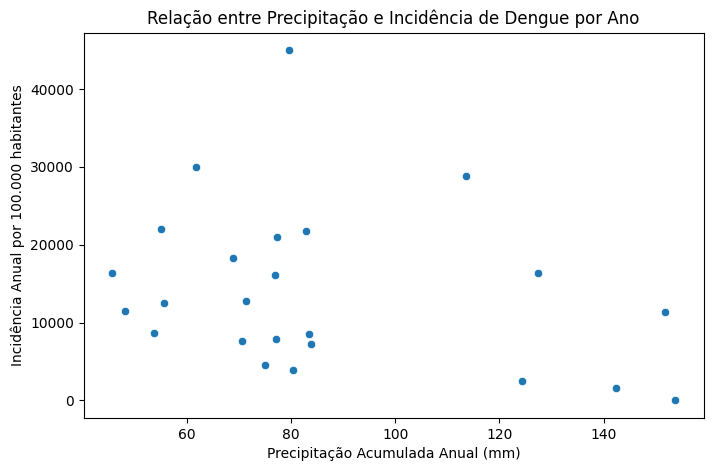

In [8]:
df_anual = df_mensal.groupby('ano').agg({
    'precipitacao_acumulada': 'mean', 
    'numero_casos': 'sum',  
    'populacao': 'sum'
}).reset_index()

# df_anual['incidencia_doenca'] = (df_anual['numero_casos'] / df_anual['populacao']) * 100000

correlacao_anual = df_anual.corr().loc['precipitacao_acumulada', 'numero_casos']
print(f"Correlação entre precipitação e incidência de dengue por ano: {correlacao_anual:.2f}")

plt.figure(figsize=(8,5))
sns.scatterplot(x=df_anual['precipitacao_acumulada'], y=df_anual['numero_casos'])
plt.xlabel("Precipitação Acumulada Anual (mm)")
plt.ylabel("Incidência Anual por 100.000 habitantes")
plt.title("Relação entre Precipitação e Incidência de Dengue por Ano")
plt.show()

Correlação entre precipitação e incidência de dengue por município: -0.19


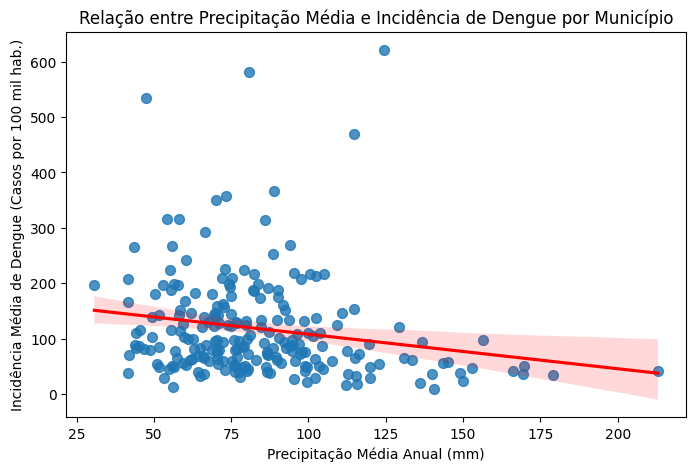

In [10]:
#  incidência  no nível mensal
df_mensal['incidencia_doenca'] = (df_mensal['numero_casos'] / df_mensal['populacao']) * 100000

df_municipios = df_mensal.groupby('municipio').agg({
    'precipitacao_acumulada': 'mean',  
    'numero_casos': 'sum',  
    'populacao': 'mean',  
    'incidencia_doenca': 'mean'
}).reset_index()

df_municipios_numerico = df_municipios.select_dtypes(include=['number']).dropna()

correlacao_municipio = df_municipios_numerico.corr().loc['precipitacao_acumulada', 'incidencia_doenca']
print(f"Correlação entre precipitação e incidência de dengue por município: {correlacao_municipio:.2f}")

df_valido = df_municipios[['precipitacao_acumulada', 'incidencia_doenca']].dropna()

plt.figure(figsize=(8, 5))
sns.regplot(
    x='precipitacao_acumulada',
    y='incidencia_doenca',
    data=df_valido,
    scatter_kws={"s": 50},
    line_kws={"color": "red"}
)

plt.xlabel("Precipitação Média Anual (mm)")
plt.ylabel("Incidência Média de Dengue (Casos por 100 mil hab.)")
plt.title("Relação entre Precipitação Média e Incidência de Dengue por Município")
# plt.savefig("relacao_dengue_pr.png", dpi=300, bbox_inches="tight")
plt.show()

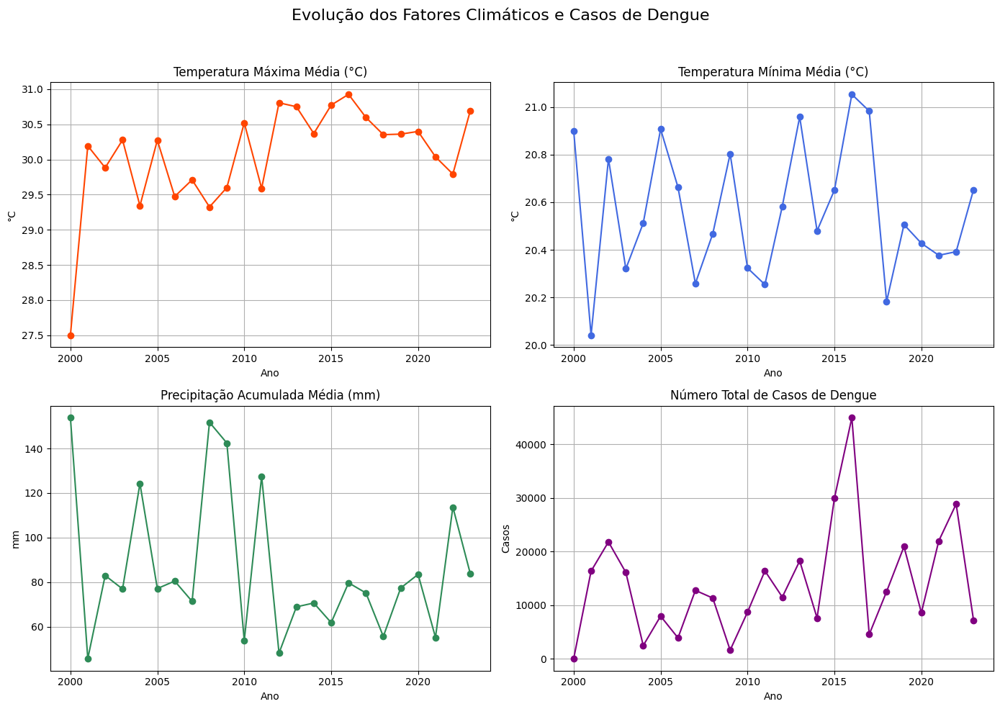

In [11]:
df_temporal_simples = df_mensal.groupby('ano').agg({
    'temperatura_max_C': 'mean',
    'temperatura_min_C': 'mean',
    'temp_media': 'mean',
    'precipitacao_acumulada': 'mean',
    'numero_casos': 'sum'
}).reset_index()

fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle("Evolução dos Fatores Climáticos e Casos de Dengue", fontsize=16)

axs[0, 0].plot(df_temporal_simples['ano'], df_temporal_simples['temperatura_max_C'], color='orangered', marker='o')
axs[0, 0].set_title("Temperatura Máxima Média (°C)")
axs[0, 0].set_xlabel("Ano")
axs[0, 0].set_ylabel("°C")
axs[0, 0].grid(True)

axs[0, 1].plot(df_temporal_simples['ano'], df_temporal_simples['temperatura_min_C'], color='royalblue', marker='o')
axs[0, 1].set_title("Temperatura Mínima Média (°C)")
axs[0, 1].set_xlabel("Ano")
axs[0, 1].set_ylabel("°C")
axs[0, 1].grid(True)

axs[1, 0].plot(df_temporal_simples['ano'], df_temporal_simples['precipitacao_acumulada'], color='seagreen', marker='o')
axs[1, 0].set_title("Precipitação Acumulada Média (mm)")
axs[1, 0].set_xlabel("Ano")
axs[1, 0].set_ylabel("mm")
axs[1, 0].grid(True)

axs[1, 1].plot(df_temporal_simples['ano'], df_temporal_simples['numero_casos'], color='purple', marker='o')
axs[1, 1].set_title("Número Total de Casos de Dengue")
axs[1, 1].set_xlabel("Ano")
axs[1, 1].set_ylabel("Casos")
axs[1, 1].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
# plt.savefig("analises/grafico_1_2.png", bbox_inches="tight")

plt.show()

Text(0.5, 1.0, 'Correlação Anual: Clima vs. Casos de Dengue')

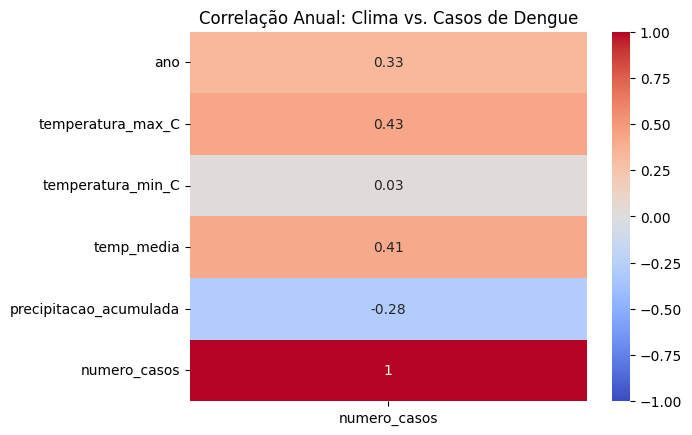

In [13]:
corr_matrix = df_temporal_simples.corr()
sns.heatmap(corr_matrix[['numero_casos']], annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.savefig("analises/grafico-corr-clima-casos", bbox_inches="tight")
plt.title('Correlação Anual: Clima vs. Casos de Dengue')

In [22]:
from scipy.stats import kendalltau
tau, p = kendalltau(df_temporal_simples['ano'], df_temporal_simples['temp_media'])
print(f"Tendência temperatura: tau={tau:.2f}, p={p:.4f}")

Tendência temperatura: tau=0.29, p=0.0493


In [27]:
from scipy.stats import kendalltau
tau, p = kendalltau(df_temporal_simples['ano'], df_temporal_simples['numero_casos'])
print(f"Casos de Dengue: tau={tau:.2f}, p={p:.4f}")

Casos de Dengue: tau=0.22, p=0.1446


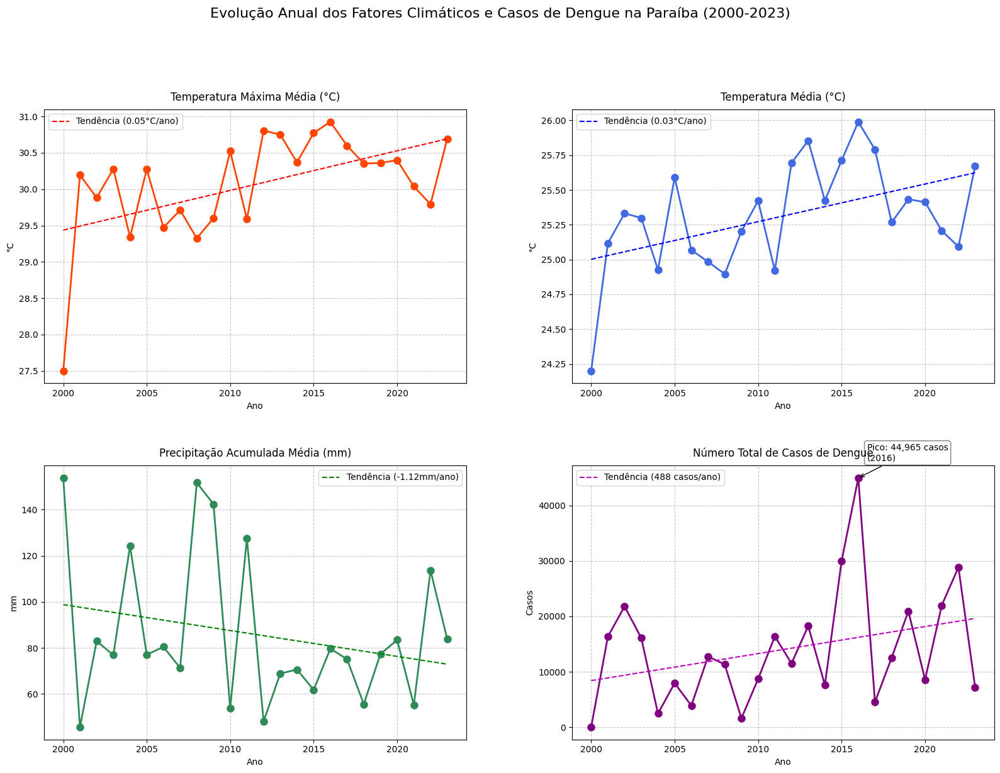

In [5]:
df_temporal_simples = df_mensal.groupby('ano').agg({
    'temperatura_max_C': 'mean',
    'temperatura_min_C': 'mean',
    'temp_media': 'mean',
    'precipitacao_acumulada': 'mean',
    'numero_casos': 'sum'
}).reset_index()

fig, axs = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Evolução Anual dos Fatores Climáticos e Casos de Dengue na Paraíba (2000-2023)", fontsize=16, y=1.02)

ax = axs[0, 0]
ax.plot(df_temporal_simples['ano'], df_temporal_simples['temperatura_max_C'], 
        color='orangered', marker='o', linewidth=2, markersize=8)

z = np.polyfit(df_temporal_simples['ano'], df_temporal_simples['temperatura_max_C'], 1)
p = np.poly1d(z)
ax.plot(df_temporal_simples['ano'], p(df_temporal_simples['ano']), "r--", 
        linewidth=1.5, label=f'Tendência ({z[0]:.2f}°C/ano)')
ax.set_title("Temperatura Máxima Média (°C)", fontsize=12, pad=10)
ax.set_xlabel("Ano", fontsize=10)
ax.set_ylabel("°C", fontsize=10)
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend()

ax = axs[0, 1]
ax.plot(df_temporal_simples['ano'], df_temporal_simples['temp_media'], 
        color='royalblue', marker='o', linewidth=2, markersize=8)
z = np.polyfit(df_temporal_simples['ano'], df_temporal_simples['temp_media'], 1)
p = np.poly1d(z)
ax.plot(df_temporal_simples['ano'], p(df_temporal_simples['ano']), "b--", 
        linewidth=1.5, label=f'Tendência ({z[0]:.2f}°C/ano)')
ax.set_title("Temperatura Média (°C)", fontsize=12, pad=10)
ax.set_xlabel("Ano", fontsize=10)
ax.set_ylabel("°C", fontsize=10)
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend()

ax = axs[1, 0]
ax.plot(df_temporal_simples['ano'], df_temporal_simples['precipitacao_acumulada'], 
        color='seagreen', marker='o', linewidth=2, markersize=8)
# 
z = np.polyfit(df_temporal_simples['ano'], df_temporal_simples['precipitacao_acumulada'], 1)
p = np.poly1d(z)
ax.plot(df_temporal_simples['ano'], p(df_temporal_simples['ano']), "g--", 
        linewidth=1.5, label=f'Tendência ({z[0]:.2f}mm/ano)')
ax.set_title("Precipitação Acumulada Média (mm)", fontsize=12, pad=10)
ax.set_xlabel("Ano", fontsize=10)
ax.set_ylabel("mm", fontsize=10)
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend()

ax = axs[1, 1]
line, = ax.plot(df_temporal_simples['ano'], df_temporal_simples['numero_casos'], 
                color='purple', marker='o', linewidth=2, markersize=8)
# linha
z = np.polyfit(df_temporal_simples['ano'], df_temporal_simples['numero_casos'], 1)
p = np.poly1d(z)
ax.plot(df_temporal_simples['ano'], p(df_temporal_simples['ano']), "m--", 
        linewidth=1.5, label=f'Tendência ({z[0]:.0f} casos/ano)')
ax.set_title("Número Total de Casos de Dengue", fontsize=12, pad=10)
ax.set_xlabel("Ano", fontsize=10)
ax.set_ylabel("Casos", fontsize=10)
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend()

max_idx = df_temporal_simples['numero_casos'].idxmax()
max_ano = df_temporal_simples.loc[max_idx, 'ano']
max_casos = df_temporal_simples.loc[max_idx, 'numero_casos']
ax.annotate(f'Pico: {max_casos:,} casos\n({max_ano})',
            xy=(max_ano, max_casos),
            xytext=(10, 20), textcoords='offset points',
            arrowprops=dict(arrowstyle="->", color='black'),
            bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=1))


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.subplots_adjust(hspace=0.3, wspace=0.25)
# plt.savefig("analises/tendencia-clima-casos.png", bbox_inches="tight")
plt.show()

In [6]:
variaveis_climaticas = ['temperatura_max_C', 'temperatura_min_C', 'temp_media', 'precipitacao_acumulada']
variavel_casos = 'numero_casos'

descricao_mensal = df_mensal[variaveis_climaticas + [variavel_casos]].describe(percentiles=[0.25, 0.5, 0.75])

descricao_anual = df_temporal_simples.describe(percentiles=[0.25, 0.5, 0.75])

print("📊 ESTATÍSTICAS DESCENTIVAS (DADOS MENSAIS)")
display(descricao_mensal.round(2))

print("\n📊 ESTATÍSTICAS DESCENTIVAS (DADOS ANUAIS AGREGADOS)")
display(descricao_anual.round(2))

📊 ESTATÍSTICAS DESCENTIVAS (DADOS MENSAIS)


,temperatura_max_C,temperatura_min_C,temp_media,precipitacao_acumulada,numero_casos
count,19038.00,19038.00,19038.00,19038.00,19038.00
mean,30.18,20.53,25.36,81.80,17.66
std,2.50,1.72,1.81,87.15,75.50
min,22.00,15.00,19.50,0.00,1.00
25%,28.00,19.00,24.00,15.00,1.00
50%,30.00,21.00,25.50,55.00,3.00
75%,32.00,22.00,26.50,119.00,10.00
max,37.00,26.00,30.50,665.00,2221.00



📊 ESTATÍSTICAS DESCENTIVAS (DADOS ANUAIS AGREGADOS)


,ano,temperatura_max_C,temperatura_min_C,temp_media,precipitacao_acumulada,numero_casos
count,24.00,24.00,24.00,24.00,24.00,24.00
mean,2011.50,30.06,20.56,25.31,85.87,14009.67
std,7.07,0.73,0.28,0.39,32.19,10452.58
min,2000.00,27.50,20.04,24.20,45.62,25.00
25%,2005.75,29.68,20.36,25.09,67.09,7504.50
50%,2011.50,30.28,20.51,25.32,77.21,12018.50
75%,2017.25,30.54,20.79,25.61,91.29,18919.00
max,2023.00,30.93,21.05,25.99,153.80,44965.00


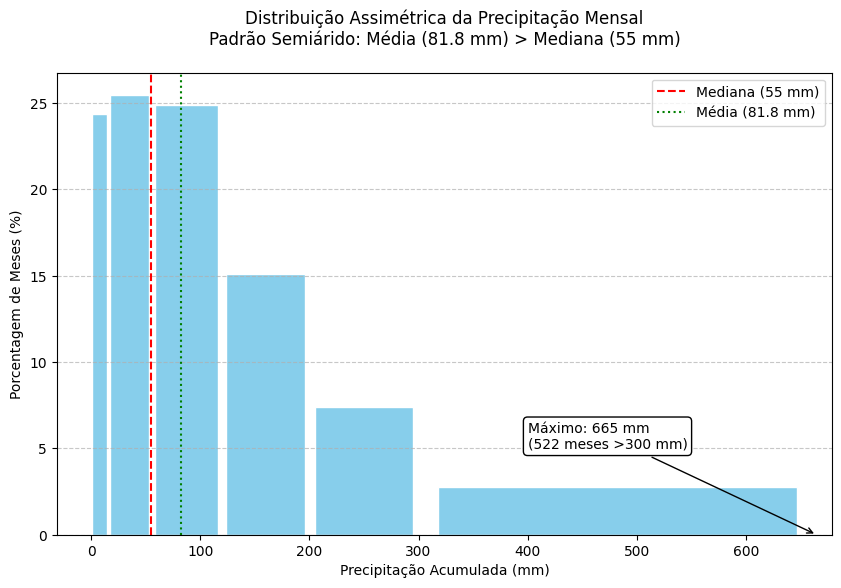

In [17]:
bins = [0, 15, 55, 119, 200, 300, 665]  # Baseado nos quartis e máximos

plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(
    df_mensal['precipitacao_acumulada'],
    bins=bins,
    color='skyblue',
    edgecolor='white',
    rwidth=0.9,
    weights=np.ones(len(df_mensal)) * 100 / len(df_mensal)  # Converter para porcentagem
)

plt.axvline(55, color='red', linestyle='--', linewidth=1.5, label=f'Mediana (55 mm)')
plt.axvline(81.8, color='green', linestyle=':', linewidth=1.5, label=f'Média (81.8 mm)')

plt.annotate(
    f'Máximo: 665 mm\n({np.sum(df_mensal["precipitacao_acumulada"] >= 300)} meses >300 mm)',
    xy=(665, 0), xytext=(400, 5),
    arrowprops=dict(arrowstyle="->"),
    bbox=dict(boxstyle="round,pad=0.3", fc="white")
)

plt.title(
    'Distribuição Assimétrica da Precipitação Mensal\n'
    'Padrão Semiárido: Média (81.8 mm) > Mediana (55 mm)',
    pad=20, fontsize=12
)
plt.xlabel('Precipitação Acumulada (mm)')
plt.ylabel('Porcentagem de Meses (%)')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.savefig("analises/assimetria-pr.png", bbox_inches="tight")
plt.show()

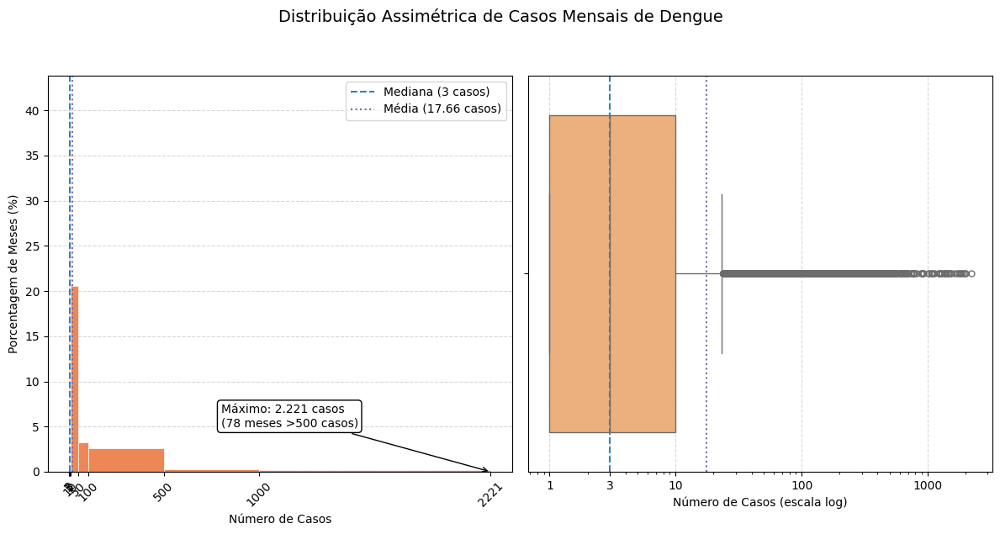

In [18]:
plt.figure(figsize=(12, 6))
plt.suptitle("Distribuição Assimétrica de Casos Mensais de Dengue", y=1.05, fontsize=14)

plt.subplot(1, 2, 1)
bins = [0, 1, 3, 10, 50, 100, 500, 1000, 2221]  #

hist = plt.hist(df_mensal['numero_casos'], bins=bins, 
                color='#e6550d', alpha=0.7, 
                edgecolor='white', linewidth=0.7,
                weights=np.ones(len(df_mensal)) * 100 / len(df_mensal))  # % por bin

plt.axvline(3, color='#3182bd', linestyle='--', linewidth=1.5, label=f'Mediana (3 casos)')
plt.axvline(17.66, color='#756bb1', linestyle=':', linewidth=1.5, label=f'Média (17.66 casos)')

plt.annotate(f'Máximo: 2.221 casos\n({np.sum(df_mensal["numero_casos"]>500)} meses >500 casos)', 
             xy=(2221, 0), xytext=(800, 5),
             arrowprops=dict(arrowstyle="->", color='black'),
             bbox=dict(boxstyle="round,pad=0.3", fc="white"))

plt.xlabel('Número de Casos')
plt.ylabel('Porcentagem de Meses (%)')
plt.xticks(bins, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend()

plt.subplot(1, 2, 2)
sns.boxplot(x=df_mensal['numero_casos'], color='#fdae6b', fliersize=5)
plt.xscale('log')  

plt.axvline(3, color='#3182bd', linestyle='--', linewidth=1.5)
plt.axvline(17.66, color='#756bb1', linestyle=':', linewidth=1.5)

plt.xlabel('Número de Casos (escala log)')
plt.xticks([1, 3, 10, 100, 1000], ['1', '3', '10', '100', '1000'])
plt.grid(axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig("analises/assimetria-casos-out.png", bbox_inches="tight")

plt.show()
# teria como ajustar, para que não seja preciso falar sobre distribuição simetrica


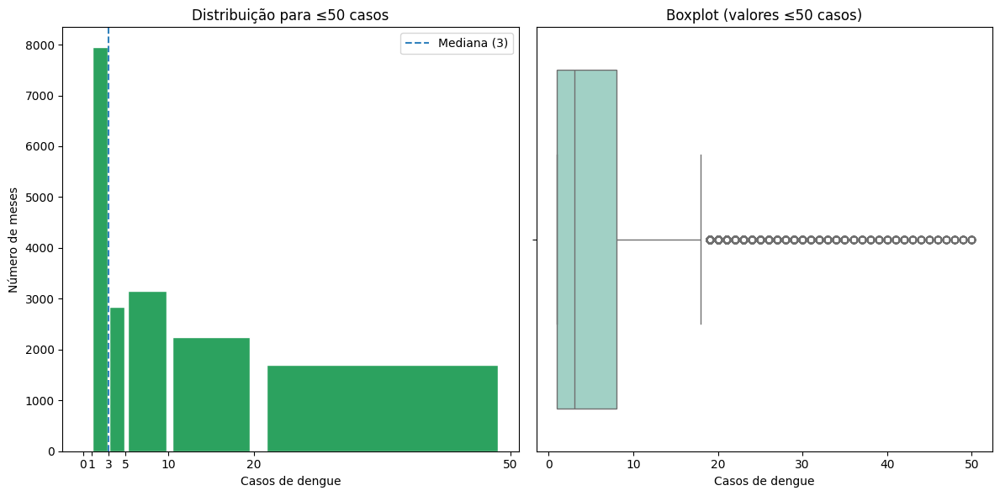

In [20]:
plt.figure(figsize=(12, 6))

df_baixos = df_mensal[df_mensal['numero_casos'] <= 50]

plt.subplot(1, 2, 1)
bins_baixos = [0, 1, 3, 5, 10, 20, 50]
plt.hist(df_baixos['numero_casos'], bins=bins_baixos, color='#2ca25f', 
         edgecolor='white', rwidth=0.9)
plt.axvline(3, color='#3182bd', linestyle='--', label='Mediana (3)')
plt.title("Distribuição para ≤50 casos")
plt.xlabel("Casos de dengue")
plt.ylabel("Número de meses")
plt.xticks(bins_baixos)
plt.legend()

plt.subplot(1, 2, 2)
sns.boxplot(x=df_baixos['numero_casos'], color='#99d8c9')
plt.title("Boxplot (valores ≤50 casos)")
plt.xlabel("Casos de dengue")

plt.tight_layout()
plt.savefig("analises/assimetria-casos-out-50.png", bbox_inches="tight")

plt.show()

In [ ]:
df_temporal_completo = df_mensal.groupby('ano').agg({
    'temperatura_max_C': ['mean', 'max', 'min'],
    'temperatura_min_C': ['mean', 'max', 'min'],
    'temp_media': ['mean', 'max', 'min'],
    'precipitacao_acumulada': ['mean', 'max', 'min'],
    'numero_casos': 'sum'
}).reset_index()

df_temporal_completo.columns = ['ano', 
                                'temp_max_mean', 'temp_max_max', 'temp_max_min',
                                'temp_min_mean', 'temp_min_max', 'temp_min_min',
                                'temp_media_mean', 'temp_media_max', 'temp_media_min',
                                'precip_mean', 'precip_max', 'precip_min',
                                'casos_total']

fig, axs = plt.subplots(3, 2, figsize=(18, 18))
fig.suptitle("Análise Completa de Fatores Climáticos e Dengue na Paraíba (2000-2023)", 
             fontsize=18, y=1.02)

def plot_with_range(ax, anos, mean, max_, min_, color, title, unit):
    ax.plot(anos, mean, color=color, marker='o', linewidth=2, label='Média')
    ax.plot(anos, max_, color=color, linestyle=':', alpha=0.5, label='Máxima')
    ax.plot(anos, min_, color=color, linestyle='--', alpha=0.5, label='Mínima')
    ax.fill_between(anos, max_, min_, color=color, alpha=0.1)
    
    # Tendência da média
    z = np.polyfit(anos, mean, 1)
    p = np.poly1d(z)
    ax.plot(anos, p(anos), "k--", linewidth=1.5, 
            label=f'Tendência ({z[0]:.2f}{unit}/ano)')
    
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Ano", fontsize=10)
    ax.set_ylabel(unit, fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.legend()

# Temperatura Máxima
plot_with_range(axs[0, 0], 
               df_temporal_completo['ano'], 
               df_temporal_completo['temp_max_mean'],
               df_temporal_completo['temp_max_max'],
               df_temporal_completo['temp_max_min'],
               'orangered', 
               "Temperatura Máxima Anual (°C)", 
               "°C")

# Temperatura Mínima
plot_with_range(axs[0, 1], 
               df_temporal_completo['ano'], 
               df_temporal_completo['temp_min_mean'],
               df_temporal_completo['temp_min_max'],
               df_temporal_completo['temp_min_min'],
               'royalblue', 
               "Temperatura Mínima Anual (°C)", 
               "°C")

# Temperatura Média
plot_with_range(axs[1, 0], 
               df_temporal_completo['ano'], 
               df_temporal_completo['temp_media_mean'],
               df_temporal_completo['temp_media_max'],
               df_temporal_completo['temp_media_min'],
               'green', 
               "Temperatura Média Anual (°C)", 
               "°C")

# Precipitação
plot_with_range(axs[1, 1], 
               df_temporal_completo['ano'], 
               df_temporal_completo['precip_mean'],
               df_temporal_completo['precip_max'],
               df_temporal_completo['precip_min'],
               'seagreen', 
               "Precipitação Anual (mm)", 
               "mm")

# Casos de Dengue (apenas total)
ax = axs[2, 0]
ax.plot(df_temporal_completo['ano'], df_temporal_completo['casos_total'], 
        color='purple', marker='o', linewidth=2, label='Casos Totais')

z = np.polyfit(df_temporal_completo['ano'], df_temporal_completo['casos_total'], 1)
p = np.poly1d(z)
ax.plot(df_temporal_completo['ano'], p(df_temporal_completo['ano']), "m--", 
        linewidth=1.5, label=f'Tendência ({z[0]:.0f} casos/ano)')

ax.set_title("Casos de Dengue (Total Anual)", fontsize=14)
ax.set_xlabel("Ano", fontsize=10)
ax.set_ylabel("Casos", fontsize=10)
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend()

axs[2, 1].axis('off')

plt.tight_layout()
plt.subplots_adjust(hspace=0.3, wspace=0.25)
plt.show()

In [ ]:
# Teste grafico de tendecia
fig, axs = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle("Evolução dos Fatores Climáticos e Casos de Dengue", fontsize=18)

axs[0, 0].plot(df_temporal_simples['ano'], df_temporal_simples['temperatura_max_C'], color='orangered', marker='o')
axs[0, 0].set_title("Temperatura Máxima Média (°C)")
axs[0, 0].set_xlabel("Ano")
axs[0, 0].set_ylabel("°C")
axs[0, 0].grid(True)

axs[0, 1].plot(df_temporal_simples['ano'], df_temporal_simples['temperatura_min_C'], color='royalblue', marker='o')
axs[0, 1].set_title("Temperatura Mínima Média (°C)")
axs[0, 1].set_xlabel("Ano")
axs[0, 1].set_ylabel("°C")
axs[0, 1].grid(True)

axs[0, 2].plot(df_temporal_simples['ano'], df_temporal_simples['temp_media'], color='darkorange', marker='o')
axs[0, 2].set_title("Temperatura Média (°C)")
axs[0, 2].set_xlabel("Ano")
axs[0, 2].set_ylabel("°C")
axs[0, 2].grid(True)

axs[1, 0].plot(df_temporal_simples['ano'], df_temporal_simples['precipitacao_acumulada'], color='seagreen', marker='o')
axs[1, 0].set_title("Precipitação Acumulada Média (mm)")
axs[1, 0].set_xlabel("Ano")
axs[1, 0].set_ylabel("mm")
axs[1, 0].grid(True)

axs[1, 1].plot(df_temporal_simples['ano'], df_temporal_simples['numero_casos'], color='purple', marker='o')
axs[1, 1].set_title("Número Total de Casos de Dengue")
axs[1, 1].set_xlabel("Ano")
axs[1, 1].set_ylabel("Casos")
axs[1, 1].grid(True)

axs[1, 2].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

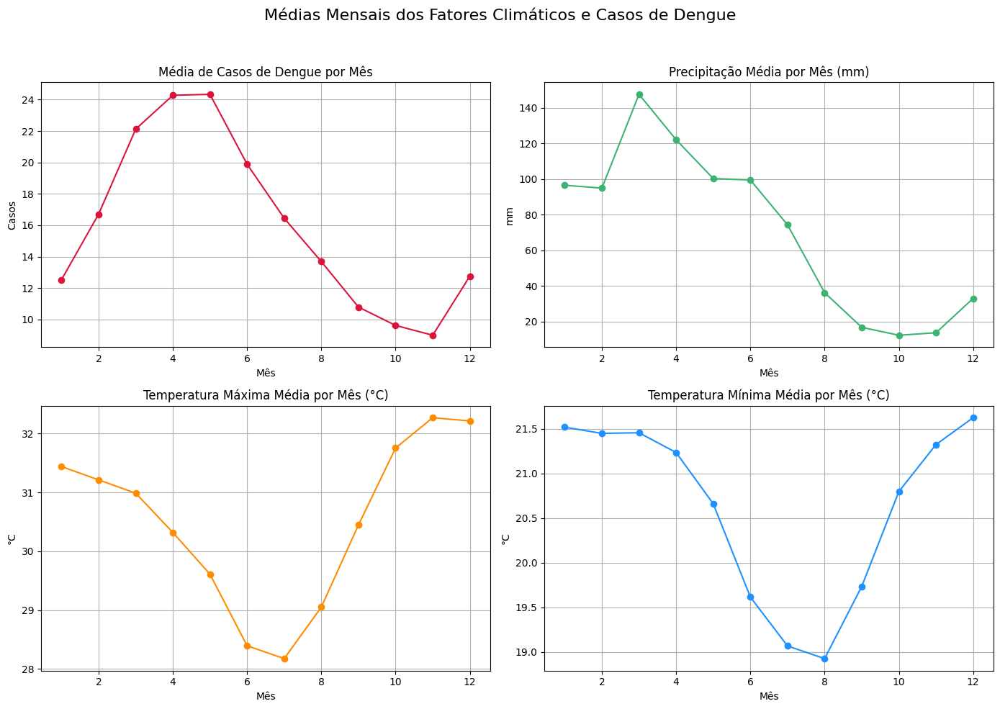

In [8]:
# Agrupar por mês e calcular médias
df_mensal_media = df_mensal.groupby('mes').agg({
    'numero_casos': 'mean',
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean',
    'temperatura_min_C': 'mean'
}).reset_index()

fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle("Médias Mensais dos Fatores Climáticos e Casos de Dengue", fontsize=16)

axs[0, 0].plot(df_mensal_media['mes'], df_mensal_media['numero_casos'], color='crimson', marker='o')
axs[0, 0].set_title("Média de Casos de Dengue por Mês")
axs[0, 0].set_xlabel("Mês")
axs[0, 0].set_ylabel("Casos")
axs[0, 0].grid(True)

axs[0, 1].plot(df_mensal_media['mes'], df_mensal_media['precipitacao_acumulada'], color='mediumseagreen', marker='o')
axs[0, 1].set_title("Precipitação Média por Mês (mm)")
axs[0, 1].set_xlabel("Mês")
axs[0, 1].set_ylabel("mm")
axs[0, 1].grid(True)

axs[1, 0].plot(df_mensal_media['mes'], df_mensal_media['temperatura_max_C'], color='darkorange', marker='o')
axs[1, 0].set_title("Temperatura Máxima Média por Mês (°C)")
axs[1, 0].set_xlabel("Mês")
axs[1, 0].set_ylabel("°C")
axs[1, 0].grid(True)

axs[1, 1].plot(df_mensal_media['mes'], df_mensal_media['temperatura_min_C'], color='dodgerblue', marker='o')
axs[1, 1].set_title("Temperatura Mínima Média por Mês (°C)")
axs[1, 1].set_xlabel("Mês")
axs[1, 1].set_ylabel("°C")
axs[1, 1].grid(True)

# Layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.savefig("analises/grafico_2_2.png", bbox_inches="tight")

plt.show()

In [32]:
df_mensal.columns

Index(['codigo_municipio', 'ano', 'mes', 'numero_casos', 'populacao',
       'data_registro', 'precipitacao_acumulada', 'temperatura_max_C',
       'temperatura_min_C', 'data_reg_clima', 'municipio', 'estado',
       'nome_regiao', 'area_km2', 'longitude', 'latitude',
       'media_ponderada_temperatura_max', 'media_ponderada_temperatura_min',
       'media_ponderada_precipitacao', 'incidencia_doenca', 'temp_media'],
      dtype='object')

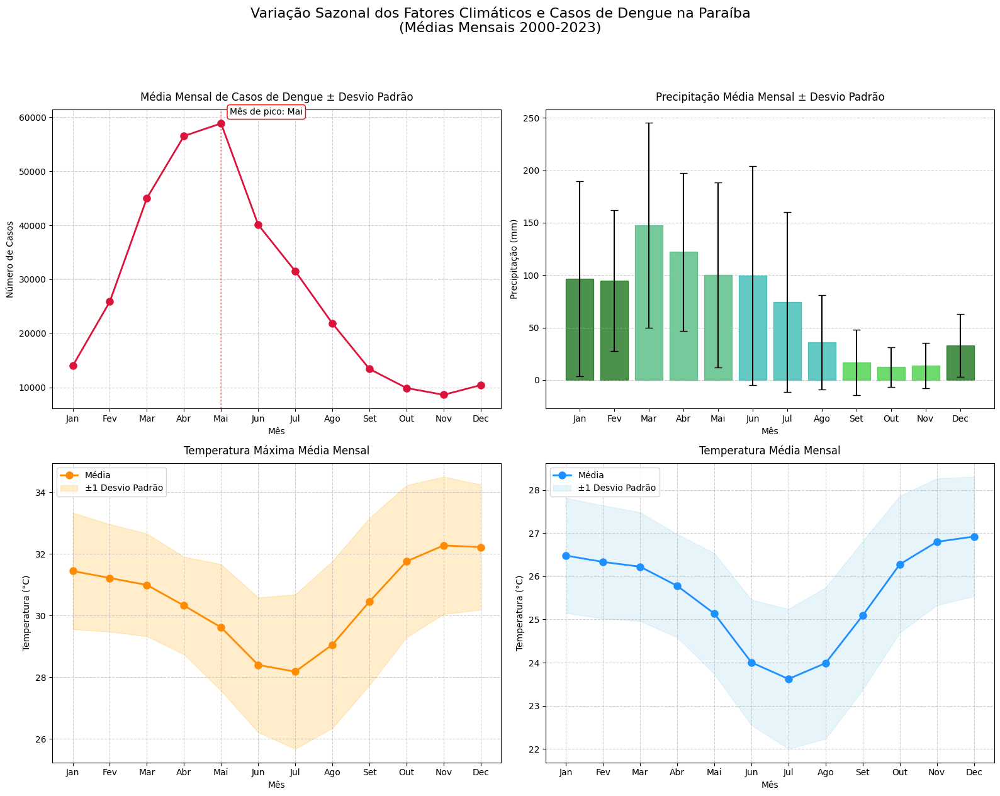


Correlação entre variáveis climáticas e casos por mês:
Precip: r = -0.85 (p = 0.000)
Temp: r = 0.20 (p = 0.539)
Temp: r = 0.02 (p = 0.942)

Correlação entre casos e variáveis climáticas:
Casos x Precip: r = 0.80 (p = 0.002)
Casos x Temp: r = -0.53 (p = 0.078)
Casos x Temp: r = -0.34 (p = 0.276)


In [30]:
df_mensal_media = df_mensal.groupby('mes').agg({
    'numero_casos': ['sum', 'std'],
    'precipitacao_acumulada': ['mean', 'std'],
    'temperatura_max_C': ['mean', 'std'],
    'temp_media': ['mean', 'std']
}).reset_index()

df_mensal_media.columns = ['mes', 'casos_sum', 'casos_std', 
                          'precip_mean', 'precip_std',
                          'temp_max_mean', 'temp_max_std',
                          'temp_media_mean', 'temp_media_std']

fig, axs = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Variação Sazonal dos Fatores Climáticos e Casos de Dengue na Paraíba\n(Médias Mensais 2000-2023)", 
             fontsize=16, y=1.05)

meses = ['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 
         'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dec']

ax = axs[0, 0]
ax.errorbar(df_mensal_media['mes'], df_mensal_media['casos_sum'], 
            yerr=df_mensal_media['casos_std'],
            fmt='-o', color='crimson', ecolor='lightcoral',
            elinewidth=2, capsize=4, linewidth=2, markersize=8)
ax.set_title("Média Mensal de Casos de Dengue ± Desvio Padrão", fontsize=12, pad=10)
ax.set_xlabel("Mês", fontsize=10)
ax.set_ylabel("Número de Casos", fontsize=10)
ax.set_xticks(range(1,13))
ax.set_xticklabels(meses)
ax.grid(True, linestyle='--', alpha=0.6)

max_mes = df_mensal_media['casos_sum'].idxmax()
ax.axvline(x=max_mes+1, color='red', linestyle=':', alpha=0.5)
ax.annotate(f'Mês de pico: {meses[max_mes]}', 
            xy=(max_mes+1, df_mensal_media.loc[max_mes, 'casos_sum']),
            xytext=(10, 10), textcoords='offset points',
            bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="red", lw=1))

ax = axs[0, 1]
bars = ax.bar(df_mensal_media['mes'], df_mensal_media['precip_mean'], 
              color='mediumseagreen', alpha=0.7,
              yerr=df_mensal_media['precip_std'], capsize=4)
ax.set_title("Precipitação Média Mensal ± Desvio Padrão", fontsize=12, pad=10)
ax.set_xlabel("Mês", fontsize=10)
ax.set_ylabel("Precipitação (mm)", fontsize=10)
ax.set_xticks(range(1,13))
ax.set_xticklabels(meses)
ax.grid(True, linestyle='--', alpha=0.6, axis='y')

for i, bar in enumerate(bars):
    if i in [0,1,11]:  
        bar.set_color('darkgreen')
    elif i in [2,3,4]: 
        bar.set_color('mediumseagreen')
    elif i in [5,6,7]:  
        bar.set_color('lightseagreen')
    elif i in [8,9,10]:
        bar.set_color('limegreen')

ax = axs[1, 0]
ax.plot(df_mensal_media['mes'], df_mensal_media['temp_max_mean'], 
        '-o', color='darkorange', linewidth=2, markersize=8,
        label='Média')
ax.fill_between(df_mensal_media['mes'],
                df_mensal_media['temp_max_mean'] - df_mensal_media['temp_max_std'],
                df_mensal_media['temp_max_mean'] + df_mensal_media['temp_max_std'],
                color='orange', alpha=0.2, label='±1 Desvio Padrão')
ax.set_title("Temperatura Máxima Média Mensal", fontsize=12, pad=10)
ax.set_xlabel("Mês", fontsize=10)
ax.set_ylabel("Temperatura (°C)", fontsize=10)
ax.set_xticks(range(1,13))
ax.set_xticklabels(meses)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()

ax = axs[1, 1]
ax.plot(df_mensal_media['mes'], df_mensal_media['temp_media_mean'], 
        '-o', color='dodgerblue', linewidth=2, markersize=8,
        label='Média')
ax.fill_between(df_mensal_media['mes'],
                df_mensal_media['temp_media_mean'] - df_mensal_media['temp_media_std'],
                df_mensal_media['temp_media_mean'] + df_mensal_media['temp_media_std'],
                color='skyblue', alpha=0.2, label='±1 Desvio Padrão')
ax.set_title("Temperatura Média Mensal", fontsize=12, pad=10)
ax.set_xlabel("Mês", fontsize=10)
ax.set_ylabel("Temperatura (°C)", fontsize=10)
ax.set_xticks(range(1,13))
ax.set_xticklabels(meses)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()

plt.tight_layout()
plt.savefig("analises/grafico_sazonal_melhorado.png", dpi=300, bbox_inches="tight")
plt.show()

print("\nCorrelação entre variáveis climáticas e casos por mês:")
for var in ['precip_mean', 'temp_max_mean', 'temp_media_mean']:
    corr, p_val = stats.pearsonr(df_mensal_media['mes'], df_mensal_media[var])
    print(f"{var.split('_')[0].title()}: r = {corr:.2f} (p = {p_val:.3f})")

print("\nCorrelação entre casos e variáveis climáticas:")
for var in ['precip_mean', 'temp_max_mean', 'temp_media_mean']:
    corr, p_val = stats.pearsonr(df_mensal_media['casos_sum'], df_mensal_media[var])
    print(f"Casos x {var.split('_')[0].title()}: r = {corr:.2f} (p = {p_val:.3f})")

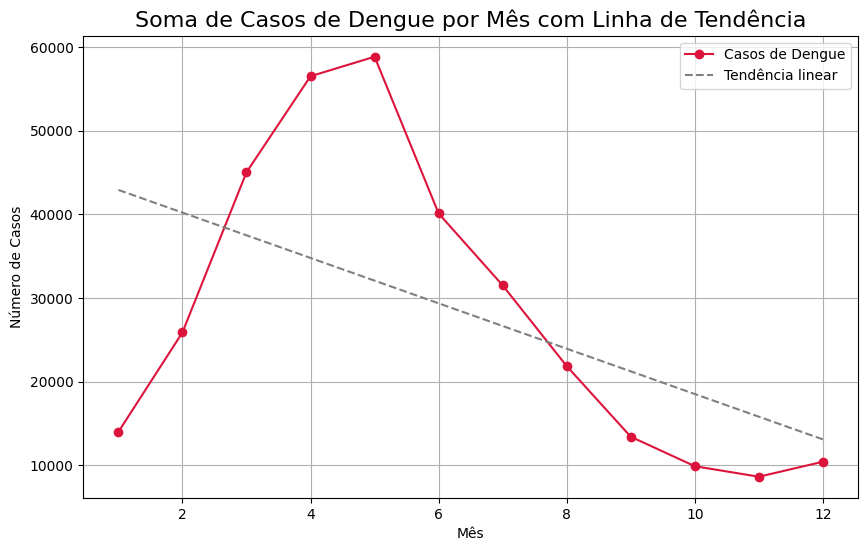

In [21]:
df_mensal_soma = df_mensal.groupby('mes').agg({
    'numero_casos': 'sum'
}).reset_index()

x = df_mensal_soma['mes']
y = df_mensal_soma['numero_casos']
coef = np.polyfit(x, y, deg=1)  
tendencia = np.poly1d(coef)

plt.figure(figsize=(10, 6))
plt.plot(x, y, color='crimson', marker='o', label='Casos de Dengue')
plt.plot(x, tendencia(x), color='gray', linestyle='--', label='Tendência linear')
plt.title("Soma de Casos de Dengue por Mês com Linha de Tendência", fontsize=16)
plt.xlabel("Mês")
plt.ylabel("Número de Casos")
plt.grid(True)
plt.legend()

# plt.savefig("analises/soma_casos_dengue_tendencia.png", bbox_inches="tight")
plt.show()

Text(0, 0.5, 'Correlação (r)')

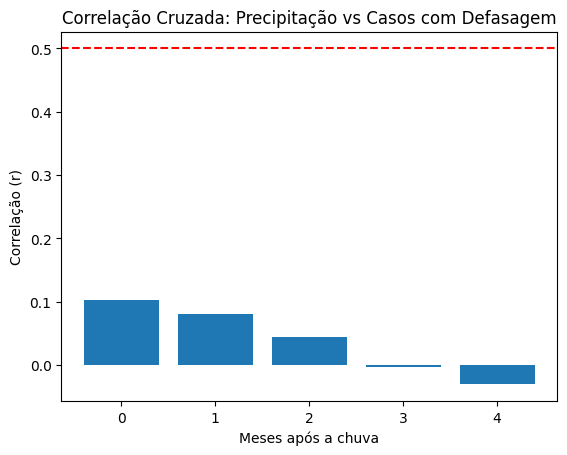

In [29]:
from statsmodels.tsa.stattools import ccf
lags = 4  # Testar até 4 meses de defasagem
corr_lag = ccf(df_mensal['precipitacao_acumulada'], 
               df_mensal['numero_casos'], 
               adjusted=False)[:lags+1]
plt.bar(range(lags+1), corr_lag, color='#1f77b4')
plt.axhline(0.5, color='red', linestyle='--')  # Limiar de relevância
plt.title('Correlação Cruzada: Precipitação vs Casos com Defasagem')
plt.xlabel('Meses após a chuva')
plt.ylabel('Correlação (r)')

In [33]:
df_mensal_media.sort_values('precip_std', ascending=False)[['mes', 'precip_mean', 'precip_std']].head()

,mes,precip_mean,precip_std
5,6,99.500248,104.183594
2,3,147.578094,97.555152
0,1,96.524150,93.047628
4,5,100.305211,88.286630
6,7,74.345853,85.536883


In [30]:
df_mensal_media[['mes', 'casos_mean', 'casos_std']].sort_values('casos_mean', ascending=False)

,mes,casos_mean,casos_std
4,5,24.337469,93.790082
3,4,24.277491,81.099309
2,3,22.120825,72.805318
5,6,19.888448,85.976550
1,2,16.704516,60.308967
6,7,16.442879,82.499911
7,8,13.683354,77.214912
11,12,12.750916,87.595866
0,1,12.526834,52.753856
8,9,10.786345,60.782671


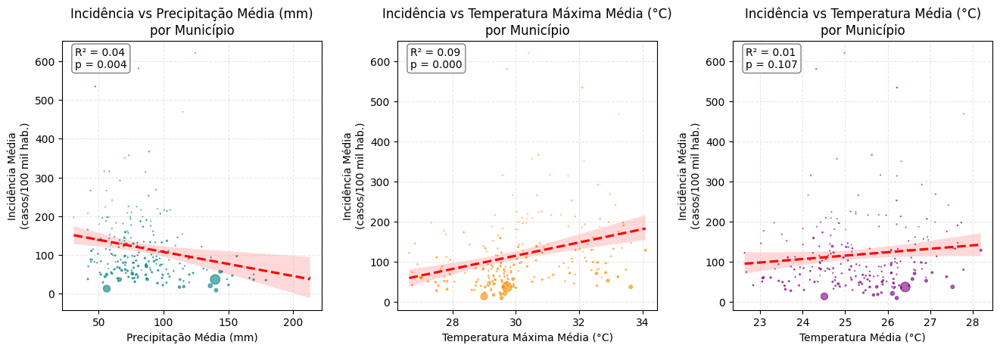

In [22]:
df_municipio = df_mensal.groupby('municipio').agg({
    'incidencia_doenca': ['mean', 'std'],
    'numero_casos': ['mean', 'std'],
    'precipitacao_acumulada': ['mean', 'std'],
    'temperatura_max_C': ['mean', 'std'],
   # 'temperatura_min_C': ['mean', 'std'],
    'temp_media': ['mean', 'std'],
    'populacao': 'first' 
}).reset_index()

df_municipio.columns = ['municipio', 'incidencia_mean', 'incidencia_std',
                       'casos_mean', 'casos_std',
                       'precip_mean', 'precip_std',
                       'temp_max_mean', 'temp_max_std',
                     #  'temp_min_mean', 'temp_min_std',
                       'temp_media_mean', 'temp_media_std',
                       'populacao']

variaveis = {
    'precip_mean': {'titulo': 'Precipitação Média (mm)', 'color': 'teal'},
    'temp_max_mean': {'titulo': 'Temperatura Máxima Média (°C)', 'color': 'darkorange'},
   # 'temp_min_mean': {'titulo': 'Temperatura Mínima Média (°C)', 'color': 'dodgerblue'},
    'temp_media_mean': {'titulo': 'Temperatura Média (°C)', 'color': 'purple'}
}

plt.figure(figsize=(18, 5))
for i, (var, config) in enumerate(variaveis.items()):
    ax = plt.subplot(1, 4, i + 1)
    
    sns.regplot(data=df_municipio, x=var, y='incidencia_mean', 
                scatter_kws={'s': df_municipio['populacao']/10000,  
                'alpha': 0.6, 'color': config['color']},
                line_kws={'color': 'red', 'linestyle': '--'})
    
    corr, p_val = stats.pearsonr(df_municipio[var], df_municipio['incidencia_mean'])
    ax.annotate(f'R² = {corr**2:.2f}\np = {p_val:.3f}', 
                xy=(0.05, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle="round", fc="white", ec="gray", pad=0.3))
    
    plt.title(f'Incidência vs {config["titulo"]}\npor Município', fontsize=12)
    plt.xlabel(config['titulo'], fontsize=10)
    plt.ylabel('Incidência Média\n(casos/100 mil hab.)', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout(pad=2.0)
plt.savefig("analises/correlacao_municipios_clima-casos.png", dpi=300, bbox_inches="tight")
plt.show()

R² > 0.5: forte relação

p < 0.05: significativo

Média e desvio padrão para variáveis climáticas (adequado para condições ambientais)

Média de incidência (casos/100k hab.) - ideal para comparação entre municípios

População como referência ('first') - mantém o contexto demográfico

In [122]:
df_joao_pessoa = df_mensal[df_mensal['municipio'] == 'joao pessoa']
df_joao_pessoa

,codigo_municipio,ano,mes,numero_casos,populacao,data_registro,precipitacao_acumulada,temperatura_max_C,temperatura_min_C,data_reg_clima,...,estado,nome_regiao,area_km2,longitude,latitude,media_ponderada_temperatura_max,media_ponderada_temperatura_min,media_ponderada_precipitacao,incidencia_doenca,temp_media
8569,2507507,2000,2,8,825796,2000-02-01,173,30.0,24.0,2000-02-29,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,30.0,24.0,173.0,0.968762,27.0
8570,2507507,2000,9,1,825796,2000-09-01,288,28.0,23.0,2000-09-30,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,28.0,23.0,288.0,0.121095,25.5
8571,2507507,2000,10,1,825796,2000-10-01,14,29.0,24.0,2000-10-31,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,29.0,24.0,14.0,0.121095,26.5
8572,2507507,2001,1,2,825796,2001-01-01,20,30.0,24.0,2001-01-31,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,30.0,24.0,20.0,0.242191,27.0
8573,2507507,2001,2,9,825796,2001-02-01,5,30.0,24.0,2001-02-28,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,30.0,24.0,5.0,1.089858,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8843,2507507,2023,8,246,825796,2023-08-01,116,29.0,22.0,2023-08-31,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,29.0,22.0,116.0,29.789440,25.5
8844,2507507,2023,9,275,825796,2023-09-01,92,30.0,23.0,2023-09-30,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,30.0,23.0,92.0,33.301203,26.5
8845,2507507,2023,10,308,825796,2023-10-01,7,31.0,24.0,2023-10-31,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,31.0,24.0,7.0,37.297347,27.5
8846,2507507,2023,11,313,825796,2023-11-01,26,32.0,24.0,2023-11-30,...,Paraíba,Nordeste,210.044,-34.869531,-7.165465,32.0,24.0,26.0,37.902823,28.0


C:\Users\mauri\AppData\Local\Temp\ipykernel_19404\2952038406.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_lag, x='Lag (meses)', y='Correlação', palette='Blues_d')


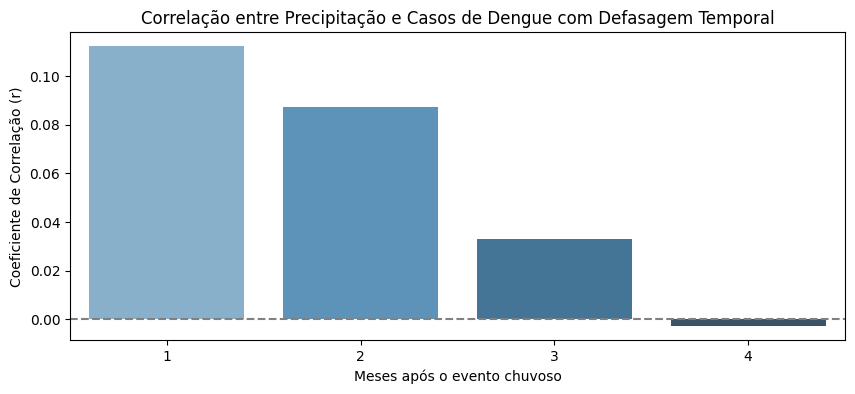

In [28]:
lags = range(1, 5) 
resultados = []
for lag in lags:
    corr = df_mensal['precipitacao_acumulada'].corr(
        df_mensal['numero_casos'].shift(-lag)  
    )
    resultados.append({'Lag (meses)': lag, 'Correlação': corr})

df_lag = pd.DataFrame(resultados)

# Gráfico de defasagem
plt.figure(figsize=(10, 4))
sns.barplot(data=df_lag, x='Lag (meses)', y='Correlação', palette='Blues_d')
plt.axhline(0, color='gray', linestyle='--')
plt.title('Correlação entre Precipitação e Casos de Dengue com Defasagem Temporal')
plt.ylabel('Coeficiente de Correlação (r)')
plt.xlabel('Meses após o evento chuvoso')
plt.show()

<Axes: >

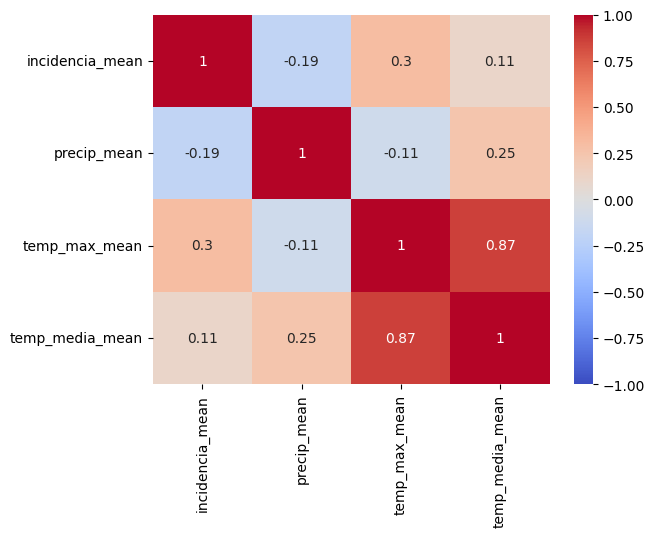

In [26]:
corr_matrix = df_municipio[['incidencia_mean', 'precip_mean', 'temp_max_mean', 'temp_media_mean']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

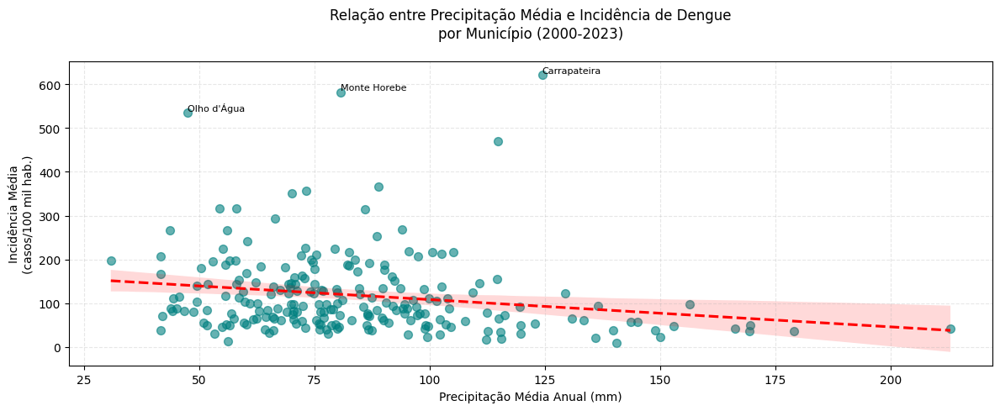

In [35]:
plt.figure(figsize=(12, 5))
sns.regplot(data=df_municipio, 
           x='precip_mean', 
           y='incidencia_mean',
           scatter_kws={'s': 50, 'alpha': 0.6, 'color': 'teal'},
           line_kws={'color': 'red', 'linestyle': '--'})

plt.title("Relação entre Precipitação Média e Incidência de Dengue\npor Município (2000-2023)", pad=20)
plt.xlabel("Precipitação Média Anual (mm)")
plt.ylabel("Incidência Média\n(casos/100 mil hab.)")
plt.grid(True, linestyle='--', alpha=0.3)

for idx, row in df_municipio.nlargest(3, 'incidencia_mean').iterrows():
    plt.annotate(row['municipio'], (row['precip_mean'], row['incidencia_mean'] + 5), fontsize=8)

plt.tight_layout()

In [131]:
df_mensal['precipitacao_lag1'] = df_mensal.groupby('codigo_municipio')['precipitacao_acumulada'].shift(1)

cor_lag = df_mensal[['numero_casos', 'precipitacao_lag1']].corr().iloc[0,1]
print(f"Correlação com 1 mês de defasagem: {cor_lag:.2f}")


Correlação com 1 mês de defasagem: 0.04


In [135]:
df_mensal['nivel_chuva'] = pd.qcut(df_mensal['precipitacao_acumulada'], q=3, labels=['Baixa', 'Média', 'Alta'])

casos_por_nivel = df_mensal.groupby('nivel_chuva', observed=True)['numero_casos'].mean()
print(casos_por_nivel)


nivel_chuva
Baixa    32.542222
Média    47.902554
Alta     50.865633
Name: numero_casos, dtype: float64


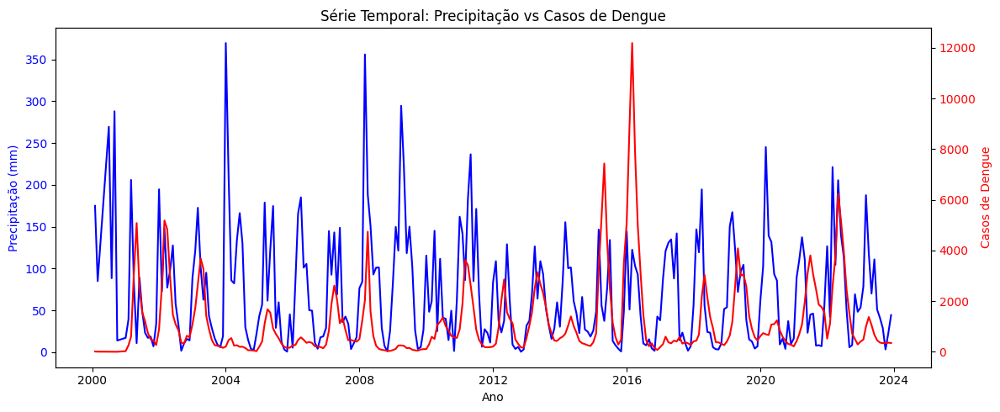

In [58]:
df_plot_media = df_mensal.groupby(['ano', 'mes']).agg({
    'precipitacao_acumulada': 'mean',   
    'numero_casos': 'sum'               
}).reset_index()

df_plot_media['data'] = pd.to_datetime(df_plot_media['ano'].astype(str) + '-' + df_plot_media['mes'].astype(str).str.zfill(2) + '-01')

fig, ax1 = plt.subplots(figsize=(12, 5))

ax1.set_title("Série Temporal: Precipitação vs Casos de Dengue")
ax1.set_xlabel("Ano")
ax1.set_ylabel("Precipitação (mm)", color='blue')
ax1.plot(df_plot_media['data'], df_plot_media['precipitacao_acumulada'], color='blue', label='Precipitação')
ax1.tick_params(axis='y', labelcolor='blue')

ax2 = ax1.twinx()
ax2.set_ylabel("Casos de Dengue", color='red')
ax2.plot(df_plot_media['data'], df_plot_media['numero_casos'], color='red', label='Casos de Dengue')
ax2.tick_params(axis='y', labelcolor='red')

fig.tight_layout()
plt.savefig("analises/pr-casos-dengue.png", bbox_inches="tight")
plt.show()

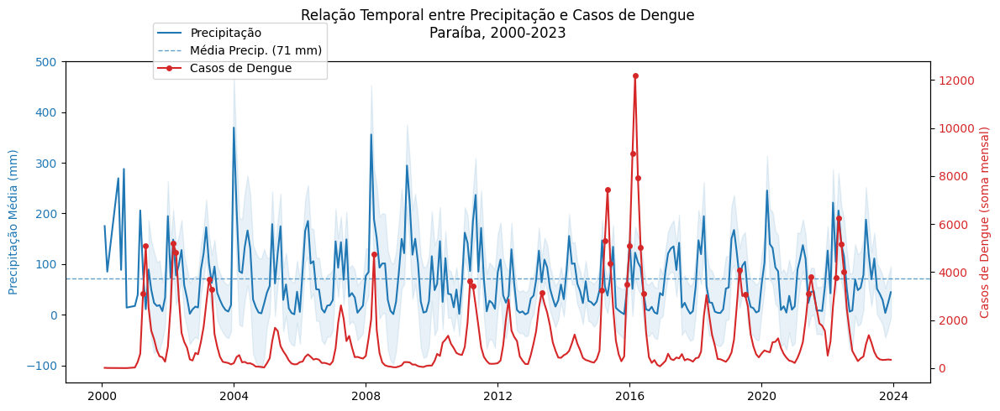

In [35]:
df_plot_media = df_mensal.groupby(['ano', 'mes']).agg({
    'precipitacao_acumulada': 'mean',   
    'numero_casos': 'sum'               
}).reset_index()

df_plot_media['data'] = pd.to_datetime(df_plot_media['ano'].astype(str) + '-' + df_plot_media['mes'].astype(str).str.zfill(2) + '-01')

fig, ax1 = plt.subplots(figsize=(12, 5))

ax1.set_ylabel("Precipitação Média (mm)", color='#1f77b4')
ax1.plot(df_plot_media['data'], df_plot_media['precipitacao_acumulada'], 
         color='#1f77b4', linewidth=1.5, label='Precipitação')
rol_std = df_plot_media['precipitacao_acumulada'].rolling(window=12).std()
ax1.fill_between(df_plot_media['data'],
                 df_plot_media['precipitacao_acumulada'] - rol_std,
                 df_plot_media['precipitacao_acumulada'] + rol_std,
                 color='#1f77b4', alpha=0.1)
ax1.tick_params(axis='y', labelcolor='#1f77b4')

media_precip = df_plot_media['precipitacao_acumulada'].mean()
ax1.axhline(y=media_precip, color='#1f77b4', linestyle='--', linewidth=1, alpha=0.7, 
            label='Média Precip. ({} mm)'.format(int(media_precip)))

ax2 = ax1.twinx()
ax2.set_ylabel("Casos de Dengue (soma mensal)", color='#d62728')
ax2.plot(df_plot_media['data'], df_plot_media['numero_casos'], 
         color='#d62728', linewidth=1.5, marker='o', markersize=4, 
         markevery=[i for i, val in enumerate(df_plot_media['numero_casos'] > df_plot_media['numero_casos'].quantile(0.9)) if val],
         label='Casos de Dengue')
ax2.tick_params(axis='y', labelcolor='#d62728')

plt.title("Relação Temporal entre Precipitação e Casos de Dengue\nParaíba, 2000-2023", pad=20)
plt.grid(axis='x', linestyle='--', alpha=0.3)
fig.legend(loc='upper left', bbox_to_anchor=(0.15, 0.95))
fig.tight_layout()

plt.savefig("analises/figura6_serie_temporal.png", dpi=300, bbox_inches="tight")
plt.show()

In [51]:
correlacao = df_mensal[['numero_casos', 'precipitacao_acumulada']].corr()
print(correlacao)

                        numero_casos  precipitacao_acumulada
numero_casos                1.000000                0.102258
precipitacao_acumulada      0.102258                1.000000


In [52]:
df_mensal['incidencia_doenca'].corr(df_mensal['precipitacao_acumulada'])

np.float64(0.02518279836489495)

In [36]:
df_anual = df_mensal.groupby('ano').agg({
    'numero_casos': 'sum',
    'temp_media': 'mean',
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'max'
}).reset_index()

corr_temp = df_anual[['numero_casos', 'temp_media']].corr().iloc[0,1]
corr_precip = df_anual[['numero_casos', 'precipitacao_acumulada']].corr().iloc[0,1]

print(f"Correlação casos x temperatura média anual: {corr_temp:.2f}")
print(f"Correlação casos x precipitação anual: {corr_precip:.2f}")

Correlação casos x temperatura média anual: 0.41
Correlação casos x precipitação anual: -0.28


In [43]:
X = df_anual[['temp_media', 'precipitacao_acumulada']]
X = sm.add_constant(X)  # Adiciona intercepto
y = df_anual['numero_casos']

modelo = sm.OLS(y, X).fit()
print(modelo.summary())

                            OLS Regression Results                            
Dep. Variable:           numero_casos   R-squared:                       0.173
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     2.199
Date:                Fri, 02 May 2025   Prob (F-statistic):              0.136
Time:                        16:58:43   Log-Likelihood:                -253.37
No. Observations:                  24   AIC:                             512.7
Df Residuals:                      21   BIC:                             516.3
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                   -2.4

In [37]:
# DAnos epidêmicos (top 25% de casos)
limiar_epidemico = df_anual['numero_casos'].quantile(0.75)
df_anual['epidemico'] = df_anual['numero_casos'] > limiar_epidemico

print("\nMédias em anos epidêmicos vs normais:")
print(df_anual.groupby('epidemico')[['temp_media', 'precipitacao_acumulada']].mean())


Médias em anos epidêmicos vs normais:
           temp_media  precipitacao_acumulada
epidemico                                    
False       25.263557               88.349012
True        25.461208               78.418170


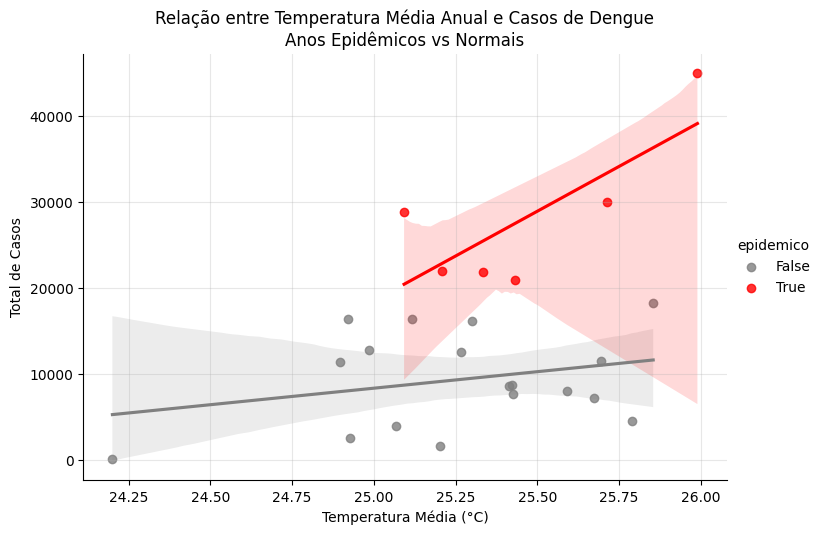

In [40]:
sns.lmplot(
    data=df_anual,
    x='temp_media',
    y='numero_casos',
    hue='epidemico',
    palette={True: 'red', False: 'gray'},
    height=5,
    aspect=1.5
)
plt.title('Relação entre Temperatura Média Anual e Casos de Dengue\nAnos Epidêmicos vs Normais')
plt.xlabel('Temperatura Média (°C)')
plt.ylabel('Total de Casos')
plt.grid(alpha=0.3)

In [44]:
df_pb = df_mensal.copy()

df_pb_agg = df_pb.groupby(['ano', 'mes']).agg({
    'precipitacao_acumulada': 'sum',
    'numero_casos': 'sum',
    'populacao': 'sum'
}).reset_index()
df_pb_agg['incidencia'] = (df_pb_agg['numero_casos'] / df_pb_agg['populacao']) * 100000

df_pb_agg = df_pb_agg.rename(columns={'ano': 'year', 'mes': 'month'})

df_pb_agg['data'] = pd.to_datetime(df_pb_agg[['year', 'month']].assign(day=1))


correlacao = df_pb_agg[['precipitacao_acumulada', 'incidencia']].corr().iloc[0, 1]

print(f"Precipitação x Numero de casos: {correlacao:.4f}")

Precipitação x Numero de casos: 0.5142


In [63]:
df_pb_agg['precipitacao_acumulada'].shift(1).corr(df_pb_agg['numero_casos'])

np.float64(0.5393281979447095)

In [64]:
df_pb_agg['precipitacao_acumulada'].shift(-1).corr(df_pb_agg['numero_casos'])

np.float64(0.42841022277455754)

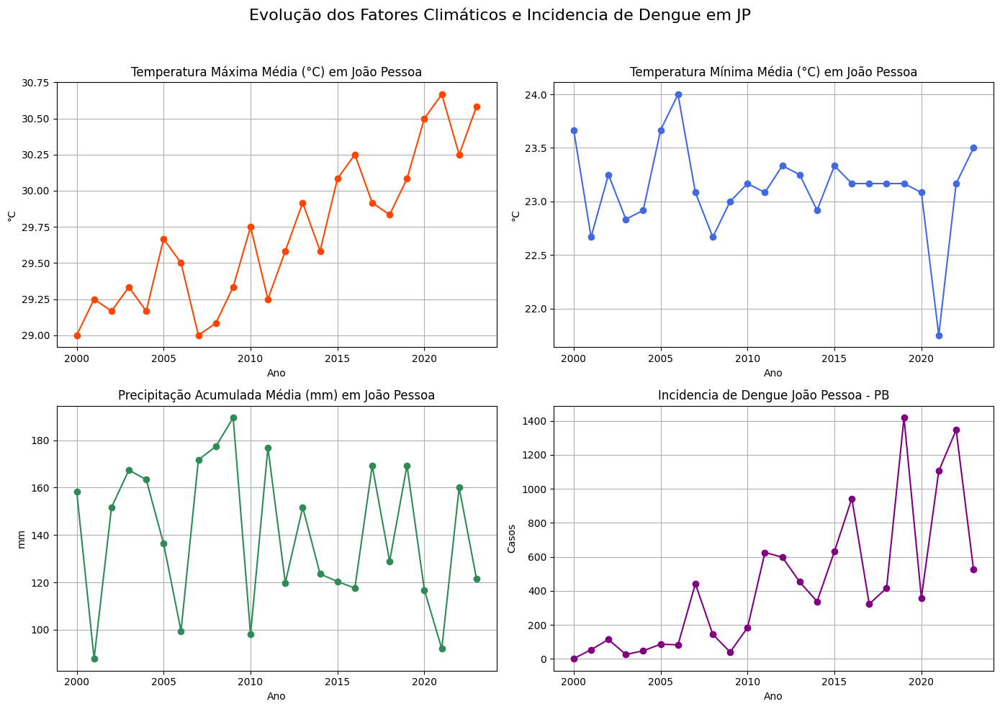

In [135]:
cidade = 'joao pessoa'
df_cidade = df_mensal[df_mensal['municipio'] == cidade].copy()

df_temporal_simples_cidade = df_cidade.groupby('ano').agg({
    'media_ponderada_temperatura_max': 'mean',
    'media_ponderada_temperatura_min': 'mean',
    'media_ponderada_precipitacao': 'mean',
    'incidencia_doenca': 'sum' 
}).reset_index()

fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle("Evolução dos Fatores Climáticos e Incidencia de Dengue em JP", fontsize=16)

axs[0, 0].plot(df_temporal_simples_cidade['ano'], df_temporal_simples_cidade['media_ponderada_temperatura_max'], color='orangered', marker='o')
axs[0, 0].set_title("Temperatura Máxima Média (°C) em João Pessoa")
axs[0, 0].set_xlabel("Ano")
axs[0, 0].set_ylabel("°C")
axs[0, 0].grid(True)


axs[0, 1].plot(df_temporal_simples_cidade['ano'], df_temporal_simples_cidade['media_ponderada_temperatura_min'], color='royalblue', marker='o')
axs[0, 1].set_title("Temperatura Mínima Média (°C) em João Pessoa")
axs[0, 1].set_xlabel("Ano")
axs[0, 1].set_ylabel("°C")
axs[0, 1].grid(True)


axs[1, 0].plot(df_temporal_simples_cidade['ano'], df_temporal_simples_cidade['media_ponderada_precipitacao'], color='seagreen', marker='o')
axs[1, 0].set_title("Precipitação Acumulada Média (mm) em João Pessoa")
axs[1, 0].set_xlabel("Ano")
axs[1, 0].set_ylabel("mm")
axs[1, 0].grid(True)


axs[1, 1].plot(df_temporal_simples_cidade['ano'], df_temporal_simples_cidade['incidencia_doenca'], color='purple', marker='o')
axs[1, 1].set_title("Incidencia de Dengue João Pessoa - PB")
axs[1, 1].set_xlabel("Ano")
axs[1, 1].set_ylabel("Casos")
axs[1, 1].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
#plt.savefig("analises/grafico_anos_JP.png", bbox_inches="tight")

plt.show()

In [142]:
cidade = 'joao pessoa'
df_cidade = df_mensal[df_mensal['municipio'] == cidade].copy()
df_cidade_plot = df_cidade.groupby(['ano', 'mes']).agg({
    'precipitacao_acumulada': 'mean',
    'numero_casos': 'sum' 
}).reset_index()

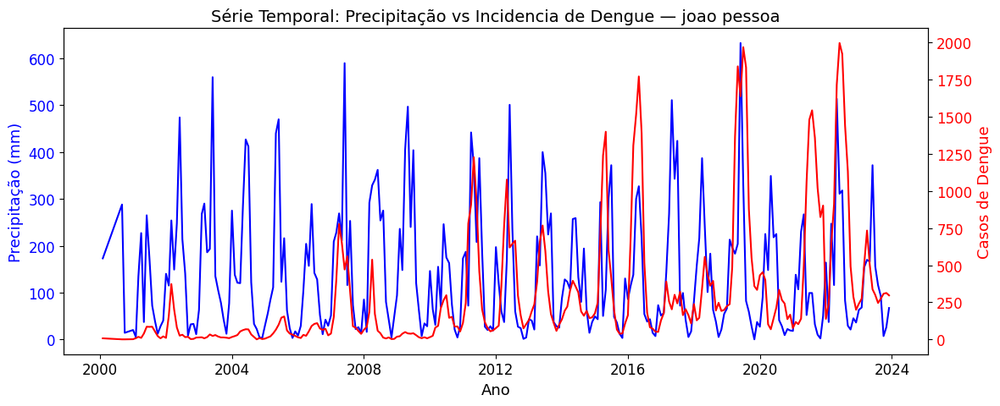

In [159]:


df_cidade_plot = df_cidade_plot.rename(columns={'ano': 'year', 'mes': 'month'})
df_cidade_plot['data'] = pd.to_datetime(df_cidade_plot[['year', 'month']].assign(day=1))


fig, ax1 = plt.subplots(figsize=(12, 5))

color = 'blue'
ax1.set_xlabel('Ano')
ax1.set_ylabel('Precipitação (mm)', color=color)
ax1.plot(df_cidade_plot['data'], df_cidade_plot['precipitacao_acumulada'], color=color, label='Precipitação')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'red'
ax2.set_ylabel('Casos de Dengue', color=color)
ax2.plot(df_cidade_plot['data'], df_cidade_plot['numero_casos'], color=color, label='Casos de Dengue')
ax2.tick_params(axis='y', labelcolor=color)

plt.title(f"Série Temporal: Precipitação vs Incidencia de Dengue — {cidade}")
fig.tight_layout()
plt.savefig("analises/grafico_Serie_T_JP.png", bbox_inches="tight")

plt.show()



In [148]:
df_mensal.columns

Index(['codigo_municipio', 'ano', 'mes', 'numero_casos', 'populacao',
       'data_registro', 'precipitacao_acumulada', 'temperatura_max_C',
       'temperatura_min_C', 'data_reg_clima', 'municipio', 'estado',
       'nome_regiao', 'area_km2', 'longitude', 'latitude',
       'media_ponderada_temperatura_max', 'media_ponderada_temperatura_min',
       'media_ponderada_precipitacao', 'incidencia_doenca', 'temp_media'],
      dtype='object')

C:\Users\mauri\AppData\Local\Temp\ipykernel_19404\797569932.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


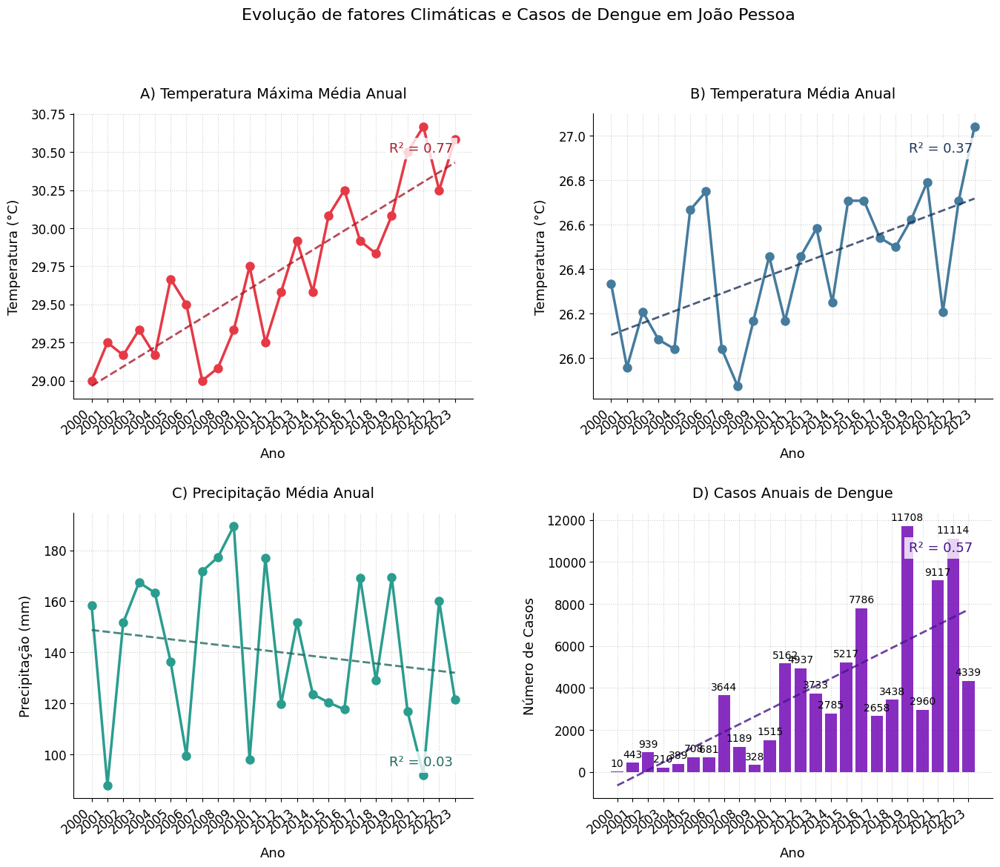

In [156]:
cidade = 'joao pessoa'
plt.rcParams.update({
    'font.size': 13,
    'axes.titlesize': 14,
    'axes.labelsize': 13,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12
})

df_cidade = df_mensal[df_mensal['municipio'].str.lower() == cidade.lower()].copy()

if df_cidade.empty:
    raise ValueError(f"Nenhum dado encontrado para a cidade: {cidade}")

df_anual = df_cidade.groupby('ano').agg({
    'temperatura_max_C': 'mean',
    'temp_media': 'mean',
    'precipitacao_acumulada': 'mean',
    'numero_casos': 'sum'
}).reset_index()

def add_trendline(ax, x, y, color):
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    line = slope * x + intercept
    ax.plot(x, line, color=color, linestyle='--', linewidth=2, alpha=0.8)
    x_pos = 0.95 if slope >= 0 else 0.95
    y_pos = 0.90 if slope >= 0 else 0.15
    ax.text(x_pos, y_pos, f'R² = {r_value**2:.2f}', 
            transform=ax.transAxes, color=color,
            ha='right', va='top', bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

fig, axs = plt.subplots(2, 2, figsize=(16, 12), gridspec_kw={'hspace': 0.4, 'wspace': 0.3})
fig.suptitle("Evolução de fatores Climáticas e Casos de Dengue em João Pessoa", fontsize=16, y=1.0)

colors = {
    'temp_max': ('#e63946', '#a81c2d'),
    'temp_min': ('#457b9d', '#1d3557'),
    'precip': ('#2a9d8f', '#1d6b60'),
    'casos': ('#7209b7', '#4a148c')
}

for ax in axs.flat:
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.set_axisbelow(True)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

ax = axs[0, 0]
ax.plot(df_anual['ano'], df_anual['temperatura_max_C'], 
        color=colors['temp_max'][0], marker='o', markersize=8, 
        linewidth=2.5)
add_trendline(ax, df_anual['ano'], df_anual['temperatura_max_C'], colors['temp_max'][1])
ax.set_title("A) Temperatura Máxima Média Anual", pad=15)
ax.set_xlabel("Ano", labelpad=10)
ax.set_ylabel("Temperatura (°C)", labelpad=10)
ax.set_xticks(df_anual['ano'])
ax.set_xticklabels(df_anual['ano'], rotation=40, ha='right')

ax = axs[0, 1]
ax.plot(df_anual['ano'], df_anual['temp_media'], 
        color=colors['temp_min'][0], marker='o', markersize=8, 
        linewidth=2.5)
add_trendline(ax, df_anual['ano'], df_anual['temp_media'], colors['temp_min'][1])
ax.set_title("B) Temperatura Média Anual", pad=15)
ax.set_xlabel("Ano", labelpad=10)
ax.set_ylabel("Temperatura (°C)", labelpad=10)
ax.set_xticks(df_anual['ano'])
ax.set_xticklabels(df_anual['ano'], rotation=40, ha='right')

ax = axs[1, 0]
ax.plot(df_anual['ano'], df_anual['precipitacao_acumulada'], 
        color=colors['precip'][0], marker='o', markersize=8, 
        linewidth=2.5)
add_trendline(ax, df_anual['ano'], df_anual['precipitacao_acumulada'], colors['precip'][1])
ax.set_title("C) Precipitação Média Anual", pad=15)
ax.set_xlabel("Ano", labelpad=10)
ax.set_ylabel("Precipitação (mm)", labelpad=10)
ax.set_xticks(df_anual['ano'])
ax.set_xticklabels(df_anual['ano'], rotation=40, ha='right')

ax = axs[1, 1]
bars = ax.bar(df_anual['ano'], df_anual['numero_casos'], 
              color=colors['casos'][0], alpha=0.85)
add_trendline(ax, df_anual['ano'], df_anual['numero_casos'], colors['casos'][1])
ax.set_title("D) Casos Anuais de Dengue", pad=15)
ax.set_xlabel("Ano", labelpad=10)
ax.set_ylabel("Número de Casos", labelpad=10)
ax.set_xticks(df_anual['ano'])
ax.set_xticklabels(df_anual['ano'], rotation=40, ha='right')

for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{int(height)}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig("analises/evolucao-joaopessoa.png", bbox_inches="tight")
plt.show()

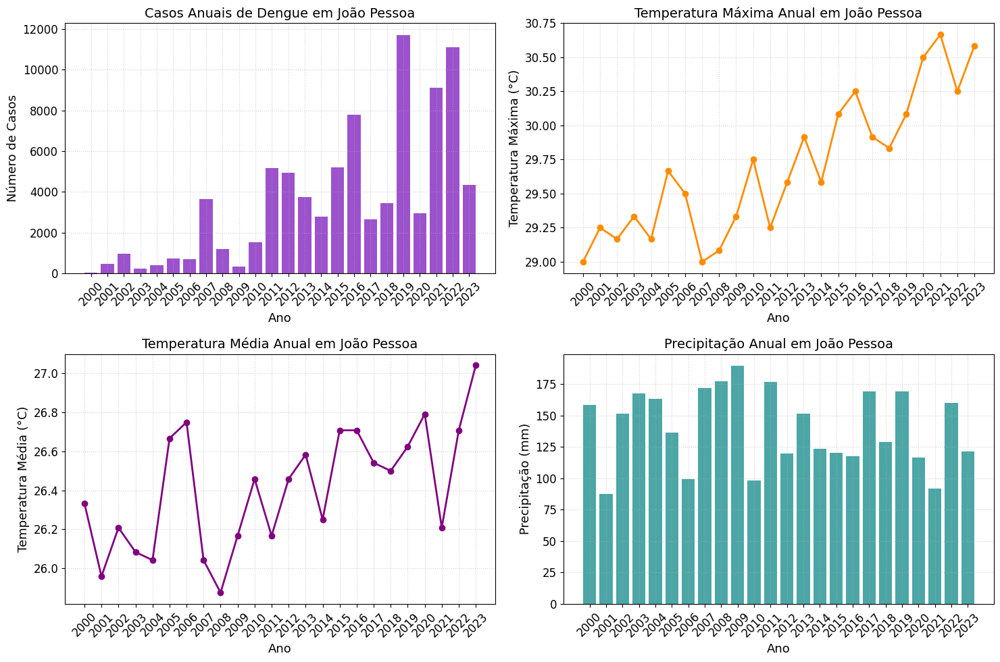

In [160]:
df_jp = df_mensal[df_mensal['municipio'].str.lower() == 'joao pessoa'].copy()

df_anual_jp = df_jp.groupby('ano').agg({
    'numero_casos': 'sum',
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean',
    'temp_media': 'mean'
}).reset_index()

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.bar(df_anual_jp['ano'], df_anual_jp['numero_casos'], color='#7209b7', alpha=0.7)
plt.title('Casos Anuais de Dengue em João Pessoa')
plt.xlabel('Ano')
plt.ylabel('Número de Casos')
plt.xticks(df_anual_jp['ano'], rotation=45)
plt.grid(True, linestyle=':', alpha=0.6)

# Gráfico 2: Temperatura máxima
plt.subplot(2, 2, 2)
plt.plot(df_anual_jp['ano'], df_anual_jp['temperatura_max_C'], 
         color='darkorange', marker='o', linewidth=2)
plt.title('Temperatura Máxima Anual em João Pessoa')
plt.xlabel('Ano')
plt.ylabel('Temperatura Máxima (°C)')
plt.xticks(df_anual_jp['ano'], rotation=45)
plt.grid(True, linestyle=':', alpha=0.6)

plt.subplot(2, 2, 3)
plt.plot(df_anual_jp['ano'], df_anual_jp['temp_media'], 
         color='purple', marker='o', linewidth=2)
plt.title('Temperatura Média Anual em João Pessoa')
plt.xlabel('Ano')
plt.ylabel('Temperatura Média (°C)')
plt.xticks(df_anual_jp['ano'], rotation=45)
plt.grid(True, linestyle=':', alpha=0.6)

plt.subplot(2, 2, 4)
plt.bar(df_anual_jp['ano'], df_anual_jp['precipitacao_acumulada'], 
        color='teal', alpha=0.7)
plt.title('Precipitação Anual em João Pessoa')
plt.xlabel('Ano')
plt.ylabel('Precipitação (mm)')
plt.xticks(df_anual_jp['ano'], rotation=45)
plt.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
# plt.savefig("analises/tendencias_jp.png", dpi=300, bbox_inches="tight")
plt.show()

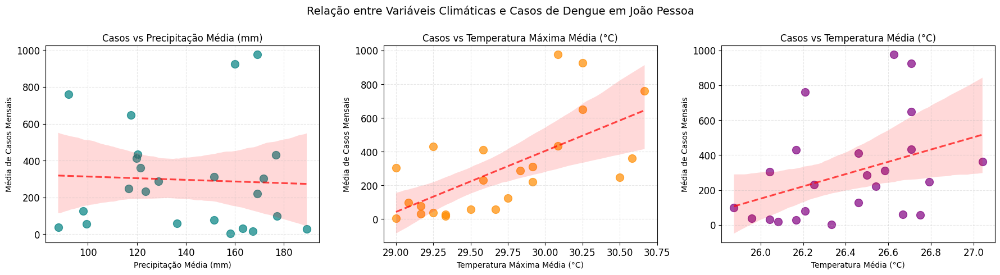

In [168]:
df_jp = df_mensal[df_mensal['municipio'].str.lower() == 'joao pessoa'].copy()

df_mensal_jp = df_jp.groupby('ano').agg({
    'numero_casos': 'mean',
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean',
    'temp_media': 'mean'
}).reset_index()

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Relação entre Variáveis Climáticas e Casos de Dengue em João Pessoa', fontsize=14)

variaveis = {
    'precipitacao_acumulada': {'titulo': 'Precipitação Média (mm)', 'color': 'teal'},
    'temperatura_max_C': {'titulo': 'Temperatura Máxima Média (°C)', 'color': 'darkorange'},
    'temp_media': {'titulo': 'Temperatura Média (°C)', 'color': 'purple'}
}

for i, (var, config) in enumerate(variaveis.items()):
    ax = axs[i]
    
   
    ax.scatter(df_mensal_jp[var], df_mensal_jp['numero_casos'], 
               color=config['color'], alpha=0.7, s=100)
    
    sns.regplot(data=df_mensal_jp, x=var, y='numero_casos', 
                scatter=False, 
                line_kws={'color': 'red', 'linestyle': '--', 'alpha': 0.7},
                ax=ax)
    
    ax.set_title(f'Casos vs {config["titulo"]}', fontsize=12)
    ax.set_xlabel(config['titulo'], fontsize=10)
    ax.set_ylabel('Média de Casos Mensais', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
# plt.savefig("analises/correlacao_jp_clima-casos.png", dpi=300, bbox_inches="tight")
plt.show()

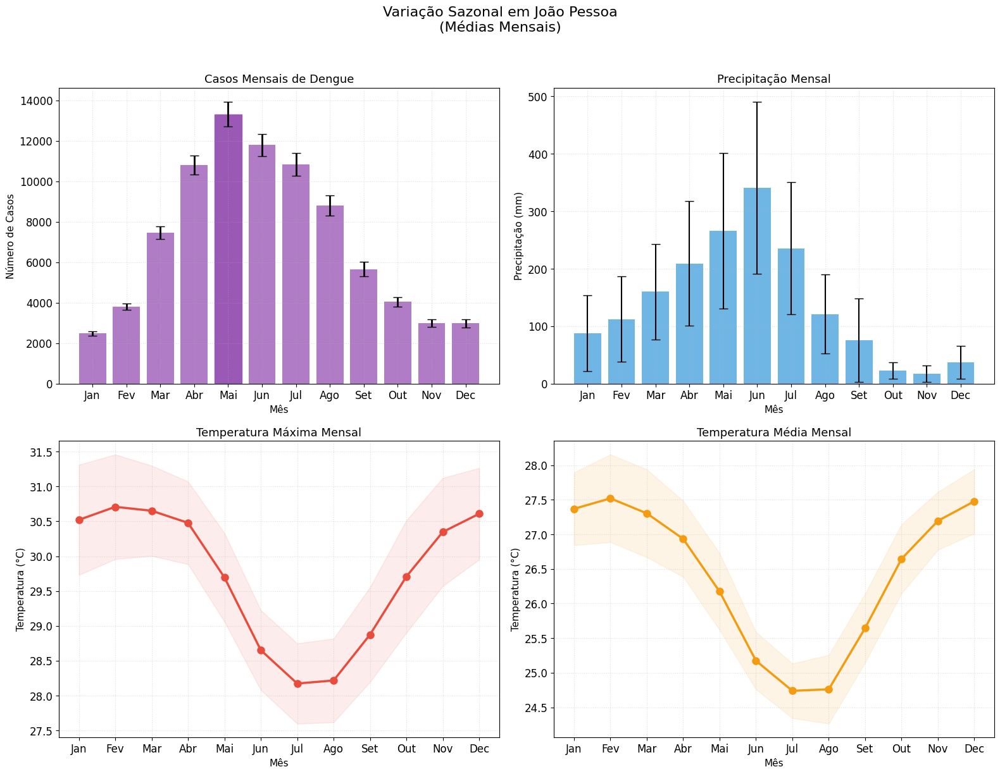

In [169]:
df_jp = df_mensal[df_mensal['municipio'].str.lower() == 'joao pessoa'].copy()

df_mensal_jp = df_jp.groupby('mes').agg({
    'numero_casos': ['sum', 'std'],
    'precipitacao_acumulada': ['mean', 'std'],
    'temperatura_max_C': ['mean', 'std'],
    'temp_media': ['mean', 'std']
}).reset_index()

df_mensal_jp.columns = ['mes', 'casos_sum', 'casos_std', 
                       'precip_mean', 'precip_std',
                       'temp_max_mean', 'temp_max_std',
                       'temp_media_mean', 'temp_media_std']

fig, axs = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Variação Sazonal em João Pessoa\n(Médias Mensais)", 
             fontsize=16, y=1.02)

meses = ['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 
         'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dec']

ax = axs[0, 0]
ax.bar(df_mensal_jp['mes'], df_mensal_jp['casos_sum'], 
       color='#8e44ad', alpha=0.7,
       yerr=df_mensal_jp['casos_std'], capsize=5, error_kw={'elinewidth': 2})

max_mes = df_mensal_jp['casos_sum'].idxmax()
ax.patches[max_mes].set_color('#9b59b6')
ax.patches[max_mes].set_alpha(1)

ax.set_title("Casos Mensais de Dengue", fontsize=13)
ax.set_xlabel("Mês", fontsize=11)
ax.set_ylabel("Número de Casos", fontsize=11)
ax.set_xticks(range(1,13))
ax.set_xticklabels(meses)
ax.grid(True, linestyle=':', alpha=0.4)

ax = axs[0, 1]
bars = ax.bar(df_mensal_jp['mes'], df_mensal_jp['precip_mean'], 
              color='#3498db', alpha=0.7,
              yerr=df_mensal_jp['precip_std'], capsize=5)

ax.set_title("Precipitação Mensal", fontsize=13)
ax.set_xlabel("Mês", fontsize=11)
ax.set_ylabel("Precipitação (mm)", fontsize=11)
ax.set_xticks(range(1,13))
ax.set_xticklabels(meses)
ax.grid(True, linestyle=':', alpha=0.4)

ax = axs[1, 0]
ax.plot(df_mensal_jp['mes'], df_mensal_jp['temp_max_mean'], 
        '-o', color='#e74c3c', linewidth=2.5, markersize=8)
ax.fill_between(df_mensal_jp['mes'],
                df_mensal_jp['temp_max_mean'] - df_mensal_jp['temp_max_std'],
                df_mensal_jp['temp_max_mean'] + df_mensal_jp['temp_max_std'],
                color='#e74c3c', alpha=0.1)

ax.set_title("Temperatura Máxima Mensal", fontsize=13)
ax.set_xlabel("Mês", fontsize=11)
ax.set_ylabel("Temperatura (°C)", fontsize=11)
ax.set_xticks(range(1,13))
ax.set_xticklabels(meses)
ax.grid(True, linestyle=':', alpha=0.4)

ax = axs[1, 1]
ax.plot(df_mensal_jp['mes'], df_mensal_jp['temp_media_mean'], 
        '-o', color='#f39c12', linewidth=2.5, markersize=8)
ax.fill_between(df_mensal_jp['mes'],
                df_mensal_jp['temp_media_mean'] - df_mensal_jp['temp_media_std'],
                df_mensal_jp['temp_media_mean'] + df_mensal_jp['temp_media_std'],
                color='#f39c12', alpha=0.1)

ax.set_title("Temperatura Média Mensal", fontsize=13)
ax.set_xlabel("Mês", fontsize=11)
ax.set_ylabel("Temperatura (°C)", fontsize=11)
ax.set_xticks(range(1,13))
ax.set_xticklabels(meses)
ax.grid(True, linestyle=':', alpha=0.4)

plt.tight_layout()
plt.savefig("analises/sazonal_jp.png", dpi=300, bbox_inches="tight")
plt.show()

In [81]:
corr_prec_casos = df_cidade['precipitacao_acumulada'].corr(df_cidade['numero_casos'])
corr_prec_incid = df_cidade['media_ponderada_precipitacao'].corr(df_cidade['incidencia_doenca'])

print(f"Correlação Precipitação x Casos de Dengue: {corr_prec_casos:.4f}")
print(f"Correlação Precipitação Média x Incidência: {corr_prec_incid:.4f}")

Correlação Precipitação x Casos de Dengue: 0.2548
Correlação Precipitação Média x Incidência: 0.2548


In [ ]:
df_análise.drop(columns='faixa_precipitacao')

In [111]:
df_análise = df_mensal.copy()

df_análise['faixa_precipitacao'] = pd.cut(
    df_análise['precipitacao_acumulada'],
    bins=[-1, 10, 50, 100, 200, 400],
    labels=['Muito Baixa', 'Baixa', 'Moderada', 'Alta', 'Muito Alta']
)

media_incidencia_por_faixa = df_análise.groupby('faixa_precipitacao', observed=True)['numero_casos'].mean()
print(media_incidencia_por_faixa)

faixa_precipitacao
Muito Baixa     8.735944
Baixa          14.515856
Moderada       19.894385
Alta           20.224942
Muito Alta     32.866667
Name: numero_casos, dtype: float64


Pouca chuva = menos criadouros.

Chuva moderada = muitos criadouros ideais (poças, recipientes).

Muita chuva = criadouros podem ser lavados ou destruídos, ou seja, não tão favoráveis.

In [ ]:
df_mensal['precipitacao_lag1'] = df_mensal.groupby('municipio')['media_ponderada_precipitacao'].shift(1)
df_mensal['temperatura_max_lag1'] = df_mensal.groupby('municipio')['media_ponderada_temperatura_max'].shift(1)
df_mensal['casos_dengue'] = df_mensal['numero_casos']

In [52]:
anos = sorted(df_mensal['ano'].unique())
df_temp_diff = df_mensal[df_mensal['ano'].isin([anos[0], anos[-1]])]

df_comp = df_temp_diff.pivot_table(index='municipio', columns='ano',
                                   values='media_ponderada_temperatura_max')

df_comp['delta_temp'] = df_comp[anos[-1]] - df_comp[anos[0]]
df_comp = df_comp.sort_values('delta_temp', ascending=False)

print(df_comp[['delta_temp']].head(10))  # Top 10 que mais aumentaram


ano                  delta_temp
municipio                      
Dona Inês              3.357143
Soledade               2.333333
João Pessoa            1.583333
Areia                 -1.000000
Aguiar                      NaN
Alagoa Grande               NaN
Alagoa Nova                 NaN
Alagoinha                   NaN
Alcantil                    NaN
Algodão de Jandaíra         NaN


In [55]:
df_comp_validos = df_comp.dropna(subset=['delta_temp'])
print(df_comp_validos[['delta_temp']].sort_values('delta_temp', ascending=False).head(10))

ano          delta_temp
municipio              
Dona Inês      3.357143
Soledade       2.333333
João Pessoa    1.583333
Areia         -1.000000


A diferença média de temperatura máxima (delta_temp) entre o primeiro e o último ano disponível nos dados.

Valores positivos indicam que a temperatura aumentou com o tempo.

Ex: Dona Inês esquentou, em média, 3,36°C no período analisado.

Valores negativos indicam que a temperatura diminuiu.

Ex: Areia teve uma redução de 1°C na temperatura máxima.

In [59]:
municipios_analisar = ['Dona Inês', 'Soledade', 'João Pessoa', 'Areia']
df_filtrado = df_mensal[df_mensal['municipio'].isin(municipios_analisar)]


In [60]:
df_inc_ano = df_filtrado.groupby(['municipio', 'ano'])['incidencia_doenca'].mean().reset_index()


In [62]:
df_delta_inc = df_inc_ano.sort_values(['municipio', 'ano']).groupby('municipio').agg(
    delta_incidencia=('incidencia_doenca', lambda x: x.iloc[-1] - x.iloc[0])
).reset_index()

df_delta_inc

,municipio,delta_incidencia
0,Areia,2.222914
1,Dona Inês,17.900172
2,João Pessoa,43.382385
3,Soledade,-6.574190


In [14]:
df_geral_anual = df_mensal.groupby('ano').agg({
    'media_ponderada_temperatura_max': 'mean',
    'media_ponderada_temperatura_min': 'mean'
}).reset_index()

In [15]:
delta_temp_max = df_geral_anual['media_ponderada_temperatura_max'].iloc[-1] - df_geral_anual['media_ponderada_temperatura_max'].iloc[0]
delta_temp_min = df_geral_anual['media_ponderada_temperatura_min'].iloc[-1] - df_geral_anual['media_ponderada_temperatura_min'].iloc[0]

print(f"Variação da temperatura máxima média: {delta_temp_max:.2f} °C")
print(f"Variação da temperatura mínima média: {delta_temp_min:.2f} °C")

Variação da temperatura máxima média: 3.19 °C
Variação da temperatura mínima média: -0.25 °C


In [37]:
geojson.columns



Index(['id', 'name', 'description', 'geometry'], dtype='object')

In [62]:
geojson['name'] = geojson['name'].str.lower().str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
df_mensal['municipio'] = df_mensal['municipio'].str.lower().str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')

df_media = df_mensal.groupby('municipio', as_index=False)['incidencia_doenca'].mean()

gdf_merged = geojson.merge(df_media, left_on='name', right_on='municipio')

In [64]:
df_total = df_mensal.groupby('municipio', as_index=False)['numero_casos'].sum()

gdf_total = geojson.merge(df_total, left_on='name', right_on='municipio')

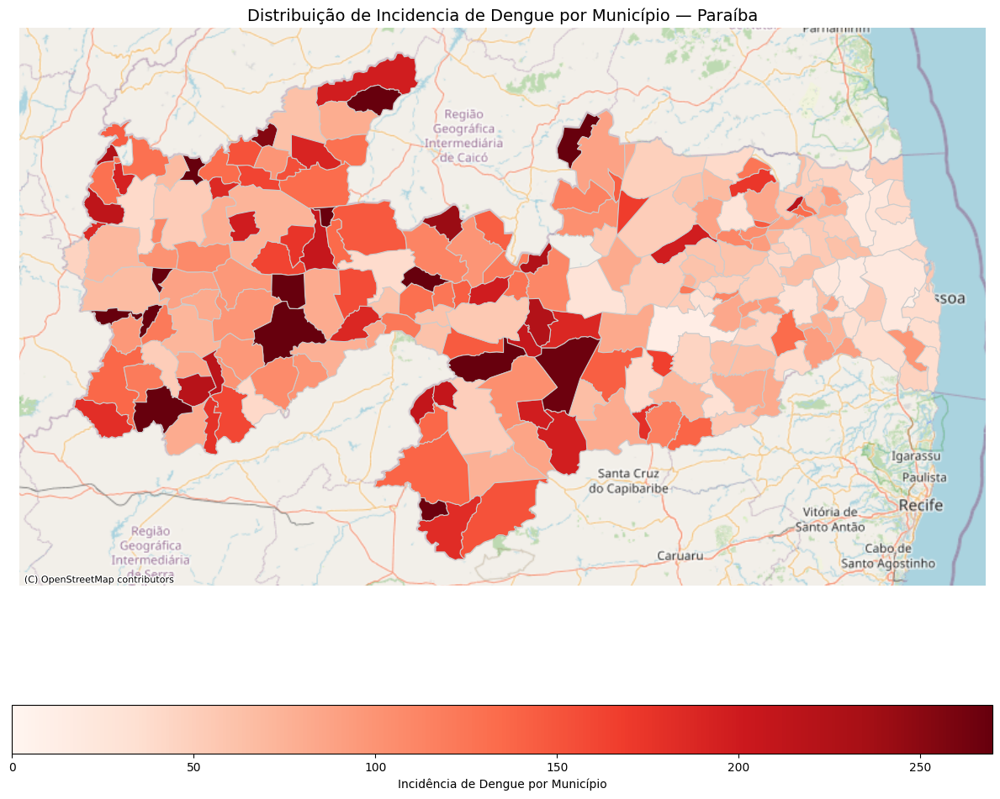

In [35]:
gdf_merged = gdf_merged.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 10))

gdf_merged.plot(
    column='incidencia_doenca',
    cmap='Reds',
    linewidth=0.8,
    edgecolor='0.8',
    legend=True,
    ax=ax,
    vmin=0,             
    vmax=gdf_merged['incidencia_doenca'].quantile(0.95),
    legend_kwds={'label': "Incidência de Dengue por Município", 'orientation': "horizontal"}
)


ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=gdf_merged.crs.to_string())
ax.set_title("Distribuição de Incidencia de Dengue por Município — Paraíba", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
# plt.savefig("analises/mapa-pb.png", bbox_inches="tight")

plt.show()

As cidades com maior incidência de dengue (as que estão acima do quantil 0.95) serão coloridas de maneira mais intensa (mais escuras) no mapa.

As cidades com baixa incidência terão uma cor mais clara.

somente 95% dos valores mais baixos estão sendo considerados para o gradiente de cor. Os 5% com maior média de incidência (os outliers) ficam todos com o mesmo tom mais escuro, e não são usados para definir o limite máximo da legenda.

C:\Users\mauri\miniconda3\envs\data-clima\lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 25 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)
C:\Users\mauri\AppData\Local\Temp\ipykernel_7512\346897857.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right')


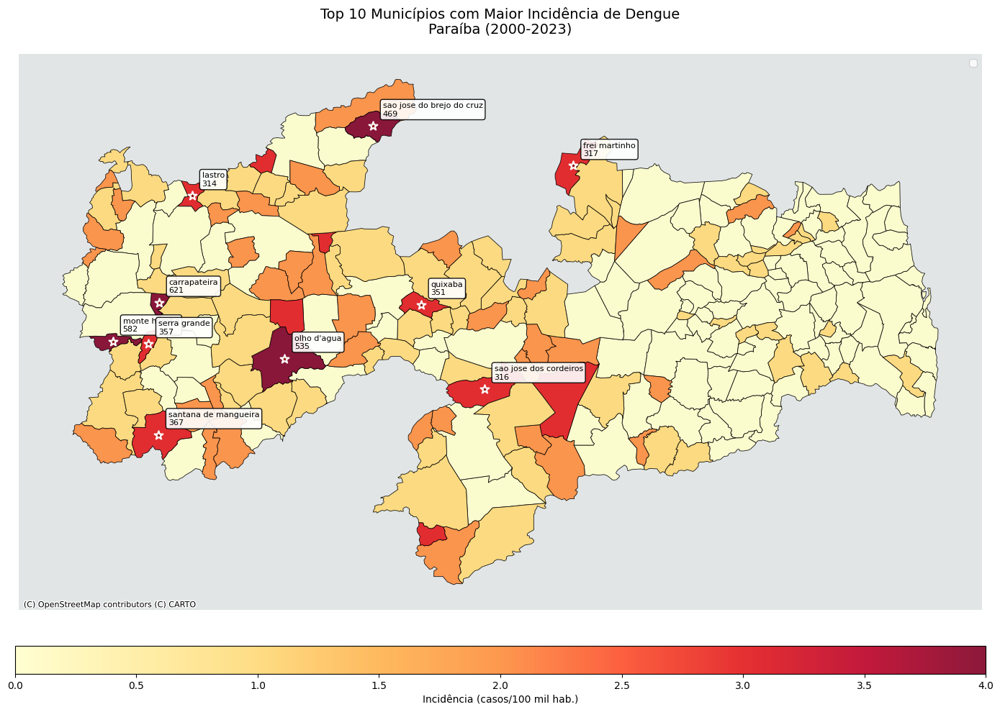

In [20]:
fig, ax = plt.subplots(figsize=(14, 12))

plot = gdf_merged.plot(
    column='incidencia_doenca',
    cmap='YlOrRd',
    linewidth=0.6,
    edgecolor='black',
    alpha=0.9,
    ax=ax,
    scheme='natural_breaks',
    legend=True,
    legend_kwds={
        'loc': 'lower center',
        'bbox_to_anchor': (0.5, -0.05),
        'title': 'Incidência (casos/100 mil hab.)',
        'fmt': '{:.0f}'
    }
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.5)
fig.colorbar(
    plot.get_children()[0],
    cax=cax,
    orientation='horizontal',
    label='Incidência (casos/100 mil hab.)'
)


top10 = gdf_merged.nlargest(10, 'incidencia_doenca')
for idx, row in top10.iterrows():
    ax.scatter(
        x=row.geometry.centroid.x,
        y=row.geometry.centroid.y,
        color='darkred',
        s=80,
        edgecolor='white',
        linewidth=1.5,
        marker='*',
        label='Top 10' if idx == 0 else ""
    )
    ax.annotate(
        text=f"{row['municipio']}\n{row['incidencia_doenca']:.0f}",
        xy=(row.geometry.centroid.x, row.geometry.centroid.y),
        xytext=(10, 10),
        textcoords="offset points",
        fontsize=8,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", alpha=0.9)
    )

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, alpha=0.7)
ax.set_title("Top 10 Municípios com Maior Incidência de Dengue\nParaíba (2000-2023)", fontsize=14, pad=20)
ax.legend(loc='upper right')
ax.set_axis_off()
plt.savefig("analises/mapa-pb-incidencia-top10.png", bbox_inches="tight")
plt.tight_layout()
plt.show()

C:\Users\mauri\miniconda3\envs\data-clima\lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 25 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


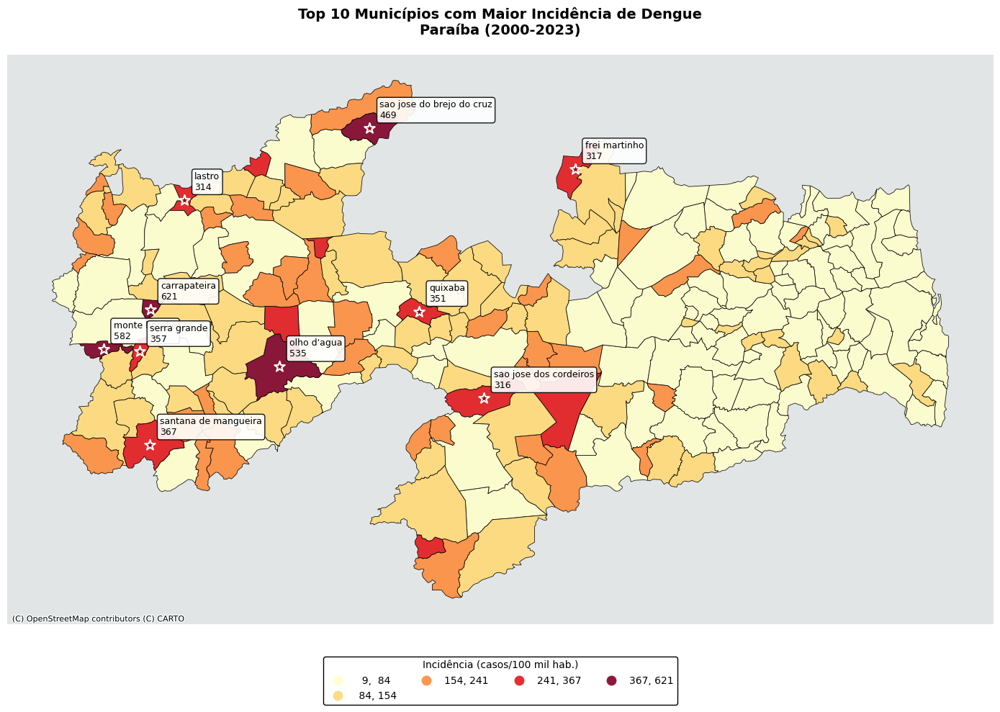

In [74]:
fig, ax = plt.subplots(figsize=(14, 12))

plot = gdf_merged.plot(
    column='incidencia_doenca',
    cmap='YlOrRd',
    linewidth=0.6,
    edgecolor='black',
    alpha=0.9,
    ax=ax,
    scheme='natural_breaks',
    legend=True,
    legend_kwds={
        'loc': 'lower center',
        'bbox_to_anchor': (0.5, -0.15),  
        'title': 'Incidência (casos/100 mil hab.)',
        'fmt': '{:.0f}',
        'frameon': True,
        'framealpha': 1,
        'edgecolor': 'black',
        'ncol': 4  
    }
)


top10 = gdf_merged.nlargest(10, 'incidencia_doenca')
top10_artist = None 

for idx, row in top10.iterrows():
    scatter = ax.scatter(
        x=row.geometry.centroid.x,
        y=row.geometry.centroid.y,
        color='darkred',
        s=120,  
        edgecolor='white',
        linewidth=1.5,
        marker='*',
        label='Top 10 Municípios' if idx == 0 else ""
    )
    if idx == 0:
        top10_artist = scatter
        
    ax.annotate(
        text=f"{row['municipio']}\n{row['incidencia_doenca']:.0f}",
        xy=(row.geometry.centroid.x, row.geometry.centroid.y),
        xytext=(10, 10),
        textcoords="offset points",
        fontsize=9,  # Aumentado ligeiramente
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", alpha=0.9)
    )

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, alpha=0.7)

ax.set_title("Top 10 Municípios com Maior Incidência de Dengue\nParaíba (2000-2023)", 
             fontsize=14, pad=20, weight='bold')

if top10_artist:
    ax.legend(handles=[top10_artist],
              loc='upper right',
              title='Legenda',
              frameon=True,
              framealpha=1,
              edgecolor='black')

ax.set_axis_off()

plt.tight_layout()
plt.savefig("analises/mapa-pb-incidencia-top10-ajus.png", dpi=300, bbox_inches="tight")
plt.show()

C:\Users\mauri\miniconda3\envs\data-clima\lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 25 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


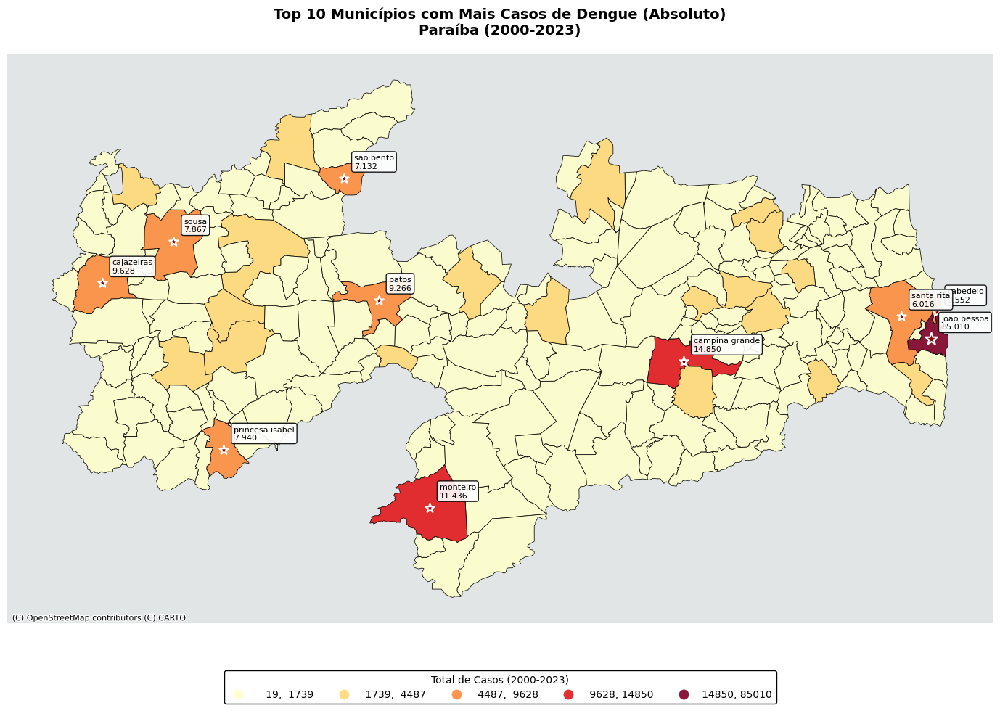

In [75]:
fig, ax = plt.subplots(figsize=(14, 12))

plot = gdf_total.plot(
    column='numero_casos',  
    cmap='YlOrRd',
    linewidth=0.6,
    edgecolor='black',
    alpha=0.9,
    ax=ax,
    scheme='natural_breaks',
    legend=True,
    legend_kwds={
        'loc': 'lower center',
        'bbox_to_anchor': (0.5, -0.15),
        'title': 'Total de Casos (2000-2023)',
        'fmt': '{:.0f}',
        'frameon': True,
        'framealpha': 1,
        'edgecolor': 'black',
        'ncol': 5  
    }
)

legend_artists = []

top10 = gdf_total.nlargest(10, 'numero_casos')
for idx, row in top10.iterrows():
    scatter = ax.scatter(
        x=row.geometry.centroid.x,
        y=row.geometry.centroid.y,
        color='darkred',
        s=80 + (row['numero_casos'] / 1000),
        edgecolor='white',
        linewidth=1.5,
        marker='*',
        label='Top 10 Municípios'
    )
    ax.annotate(
        text=f"{row['municipio']}\n{row['numero_casos']:,}".replace(",", "."),
        xy=(row.geometry.centroid.x, row.geometry.centroid.y),
        xytext=(10, 10),
        textcoords="offset points",
        fontsize=8,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", alpha=0.9)
    )
    if idx == 0:
        legend_artists.append(scatter)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, alpha=0.7)

ax.set_title("Top 10 Municípios com Mais Casos de Dengue (Absoluto)\nParaíba (2000-2023)", 
             fontsize=14, pad=20,  weight='bold')

if legend_artists:
    ax.legend(handles=legend_artists, 
              loc='upper right', 
              frameon=True, 
              framealpha=1, 
              edgecolor='black')

ax.set_axis_off()

plt.tight_layout()
plt.savefig("analises/mapa-pb-casos-absolutos-top10.png", dpi=300, bbox_inches="tight")
plt.show()

In [73]:
top_cidades = gdf_merged[["municipio", "incidencia_doenca"]].sort_values(by="incidencia_doenca", ascending=False)

print(top_cidades.head(10))


                     municipio  incidencia_doenca
54                carrapateira         621.468927
122               monte horebe         581.581170
130                olho d'agua         534.939354
190  sao jose do brejo do cruz         469.433668
171       santana de mangueira         367.000342
200               serra grande         357.020590
155                    quixaba         351.006677
81               frei martinho         316.511419
192     sao jose dos cordeiros         315.625600
104                     lastro         314.242434


quantile(0.95),  garante que as cidades com as 5% maiores incidências terão uma cor mais forte (escura) no mapa.

In [76]:
total_casos = df_mensal.groupby("municipio")["numero_casos"].sum().reset_index()
total_casos = total_casos.sort_values(by="numero_casos", ascending=False)
display(total_casos.head(10)) 

,municipio,numero_casos
93,joao pessoa,85010
49,campina grande,14850
122,monteiro,11436
45,cajazeiras,9628
39,cabedelo,9552
134,patos,9266
152,princesa isabel,7940
209,sousa,7867
176,sao bento,7132
170,santa rita,6016


In [13]:
media_anual = df_mensal.groupby(["municipio", "ano"])["incidencia_doenca"].mean().reset_index()

pico_por_municipio = media_anual.loc[media_anual.groupby("municipio")["incidencia_doenca"].idxmax()]
pico_por_municipio = pico_por_municipio.sort_values(by="incidencia_doenca", ascending=False)
display(pico_por_municipio.head(10)) 


,municipio,ano,incidencia_doenca
2132,Monte Horebe,2016,3562.769673
938,Carrapateira,2007,2536.231884
2277,Olho d'Água,2001,2523.831849
2765,Quixaba,2012,2065.704331
1042,Conceição,2016,2033.631109
3346,São Domingos,2018,2003.847387
2826,Riacho dos Cavalos,2016,1949.152542
537,Bom Jesus,2008,1874.034003
3487,São José do Brejo do Cruz,2022,1647.446458
1056,Condado,2016,1556.089262


In [15]:
media_geral = df_mensal.groupby("municipio").agg({
    "incidencia_doenca": "mean",
    "populacao": "mean"  # ou "first", "last"
}).reset_index()

media_geral = media_geral.sort_values(by="incidencia_doenca", ascending=False)

display(media_geral.head(10))


,municipio,incidencia_doenca,populacao
51,Carrapateira,621.468927,2714.0
119,Monte Horebe,581.581170,4867.0
128,Olho d'Água,534.939354,6399.0
198,São José do Brejo do Cruz,469.433668,1821.0
171,Santana de Mangueira,367.000342,5098.0
176,Serra Grande,357.020590,2921.0
154,Quixaba,351.006677,2009.0
77,Frei Martinho,316.511419,2989.0
200,São José dos Cordeiros,315.625600,3607.0
102,Lastro,314.242434,2698.0


cidade pequena, poucos casos absolutos já geram altas taxas proporcionais, o que pode causar distorções quando comparada a cidades maiores.
fatores como clima semiárido, saneamento básico precário ou falta de campanhas de prevenção podem intensificar surtos.

In [78]:
df_mensal.columns

Index(['codigo_municipio', 'ano', 'mes', 'numero_casos', 'populacao',
       'data_registro', 'precipitacao_acumulada', 'temperatura_max_C',
       'temperatura_min_C', 'data_reg_clima', 'municipio', 'estado',
       'nome_regiao', 'area_km2', 'longitude', 'latitude',
       'media_ponderada_temperatura_max', 'media_ponderada_temperatura_min',
       'media_ponderada_precipitacao', 'incidencia_doenca', 'temp_media'],
      dtype='object')

In [96]:
top10_casos = (df_mensal.groupby('municipio')
               .agg({
                   'numero_casos': 'sum',
                   'incidencia_doenca': 'mean',
                   'populacao': 'first',
                   'precipitacao_acumulada': 'mean',
                   'temperatura_max_C': 'mean',
                   'temp_media': 'mean'
               })
               .nlargest(10, 'numero_casos')
               .reset_index())

top10_formatado = top10_casos.copy()
top10_formatado['casos_por_ano'] = top10_formatado['numero_casos'] / (df_mensal['ano'].nunique())
top10_formatado = top10_formatado[[
    'municipio', 'populacao', 'numero_casos', 'casos_por_ano', 
    'incidencia_doenca', 'precipitacao_acumulada', 'temperatura_max_C', 'temp_media'
]]

print(top10_formatado.to_markdown(index=False, floatfmt=".1f"))

| municipio       |   populacao |   numero_casos |   casos_por_ano |   incidencia_doenca |   precipitacao_acumulada |   temperatura_max_C |   temp_media |
|:----------------|------------:|---------------:|----------------:|--------------------:|-------------------------:|--------------------:|-------------:|
| joao pessoa     |      825796 |          85010 |          3542.1 |                36.9 |                    139.8 |                29.7 |         26.4 |
| campina grande  |      413830 |          14850 |           618.8 |                13.2 |                     56.2 |                29.0 |         24.5 |
| monteiro        |       33638 |          11436 |           476.5 |               138.8 |                     49.4 |                30.7 |         24.7 |
| cajazeiras      |       62576 |           9628 |           401.2 |                70.6 |                     86.8 |                32.6 |         26.6 |
| cabedelo        |       69773 |           9552 |           398.0 |  

In [79]:
top10_incidencia = (
    df_mensal.groupby('municipio')
    .agg({
        'numero_casos': 'sum',
        'incidencia_doenca': 'mean',
        'populacao': 'first',
        'precipitacao_acumulada': 'mean',
        'temperatura_max_C': 'mean',
        'temp_media': 'mean'
    })
    .nlargest(10, 'incidencia_doenca')
    .reset_index()
)

top10_incidencia_formatado = top10_incidencia.copy()
top10_incidencia_formatado['casos_por_ano'] = top10_incidencia_formatado['numero_casos'] / df_mensal['ano'].nunique()
top10_incidencia_formatado = top10_incidencia_formatado[[
    'municipio', 'populacao', 'numero_casos', 'casos_por_ano', 
    'incidencia_doenca', 'precipitacao_acumulada', 'temperatura_max_C', 'temp_media'
]]

print(top10_incidencia_formatado.to_markdown(index=False, floatfmt=".1f"))


| municipio                 |   populacao |   numero_casos |   casos_por_ano |   incidencia_doenca |   precipitacao_acumulada |   temperatura_max_C |   temp_media |
|:--------------------------|------------:|---------------:|----------------:|--------------------:|-------------------------:|--------------------:|-------------:|
| carrapateira              |        2714 |            506 |            21.1 |               621.5 |                    124.4 |                30.4 |         25.0 |
| monte horebe              |        4867 |           1019 |            42.5 |               581.6 |                     80.6 |                29.7 |         24.3 |
| olho d'agua               |        6399 |           1335 |            55.6 |               534.9 |                     47.3 |                32.1 |         26.2 |
| sao jose do brejo do cruz |        1821 |            265 |            11.0 |               469.4 |                    114.8 |                33.3 |         27.8 |
| santana 

In [19]:
top10_casos = (df_mensal.groupby('municipio')
               .agg({
                   'numero_casos': 'sum',
                   'incidencia_doenca': 'mean',
                   'populacao': 'first',
                   'precipitacao_acumulada': ['mean', 'std'],
                   'temperatura_max_C': ['mean', 'std']
               })
               .nlargest(10, ('numero_casos', 'sum'))
               .reset_index())

top10_casos.columns = ['municipio', 'numero_casos', 'incidencia_media',
                      'populacao', 'precipitacao_media', 'precipitacao_std',
                      'temp_max_media', 'temp_max_std']

n_anos = df_mensal['ano'].nunique()
top10_formatado = top10_casos.assign(
    casos_por_ano = lambda x: x['numero_casos'] / n_anos,
    precipitacao = lambda x: x.apply(lambda r: f"{r['precipitacao_media']:.1f} ± {r['precipitacao_std']:.1f}", axis=1),
    temperatura_max = lambda x: x.apply(lambda r: f"{r['temp_max_media']:.1f} ± {r['temp_max_std']:.1f}", axis=1)
)

cols_to_show = [
    'municipio', 'populacao', 'numero_casos', 'casos_por_ano', 'incidencia_media',
    'precipitacao', 'temperatura_max'
]

try:
    print(tabulate(
        top10_formatado[cols_to_show],
        headers=['Município', 'População', 'Casos Totais', 'Casos/Ano', 
                'Incidência Média', 'Precipitação (mm)', 'Temp. Máx. (°C)'],
        tablefmt='github',
        floatfmt=".1f"
    ))
except NameError:
    print("\nTop 10 Municípios - Casos de Dengue")
    print(top10_formatado[cols_to_show].to_string(index=False, float_format=".1f"))

|    | Município       |   População |   Casos Totais |   Casos/Ano |   Incidência Média | Precipitação (mm)   | Temp. Máx. (°C)   |
|----|-----------------|-------------|----------------|-------------|--------------------|---------------------|-------------------|
|  0 | joao pessoa     |      825796 |          85010 |      3542.1 |               36.9 | 139.8 ± 131.5       | 29.7 ± 1.2        |
|  1 | campina grande  |      413830 |          14850 |       618.8 |               13.2 | 56.2 ± 55.5         | 29.0 ± 2.0        |
|  2 | monteiro        |       33638 |          11436 |       476.5 |              138.8 | 49.4 ± 57.8         | 30.7 ± 2.0        |
|  3 | cajazeiras      |       62576 |           9628 |       401.2 |               70.6 | 86.8 ± 104.5        | 32.6 ± 1.9        |
|  4 | cabedelo        |       69773 |           9552 |       398.0 |               56.8 | 143.6 ± 132.8       | 29.9 ± 1.1        |
|  5 | patos           |      108766 |           9266 |       386.1 |

In [18]:
variaveis_de_interesse = [
    'incidencia_doenca', 'populacao', 'precipitacao_acumulada',
    'temperatura_max_C', 'temperatura_min_C'
]

media_geral = df_mensal.groupby("municipio")[variaveis_de_interesse].mean().reset_index()

media_geral["taxa_por_100mil"] = (media_geral["incidencia_doenca"] / media_geral["populacao"]) * 100_000

top10 = media_geral.sort_values(by="incidencia_doenca", ascending=False).head(10)


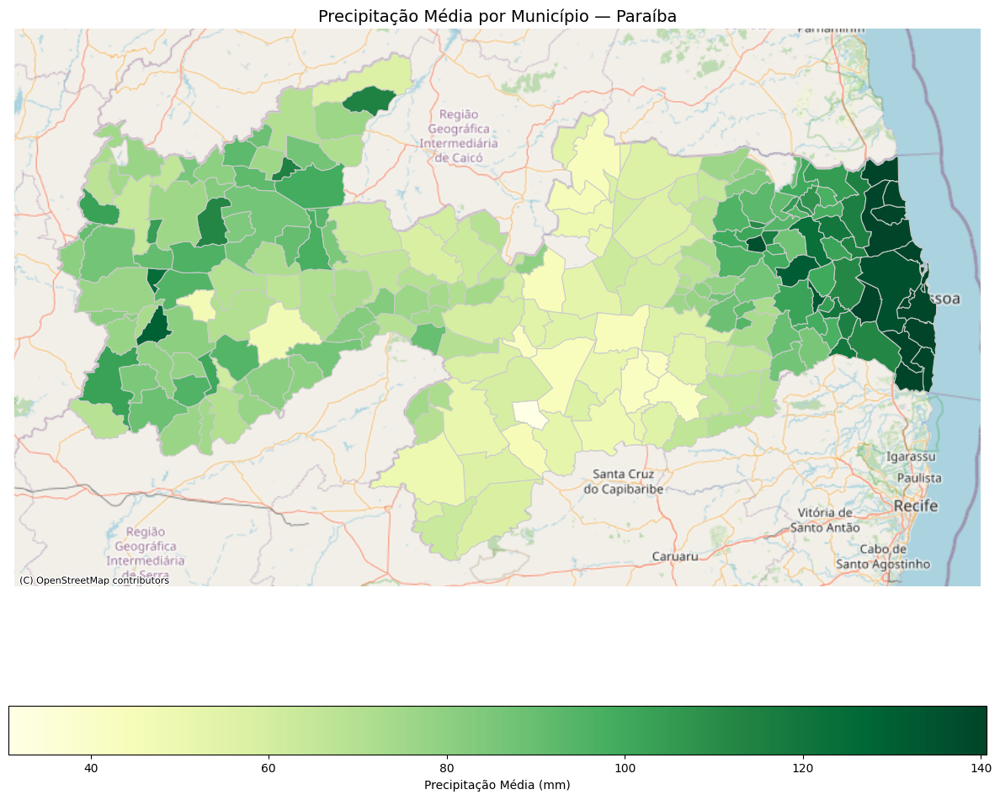

In [95]:
df_precip = df_mensal.groupby('municipio', as_index=False)['precipitacao_acumulada'].mean()
gdf_precip = geojson.merge(df_precip, left_on='name', right_on='municipio')
gdf_precip = gdf_precip.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 10))
gdf_precip.plot(
    column='precipitacao_acumulada',
    cmap='YlGn',
    linewidth=0.8,
    edgecolor='0.8',
    legend=True,
    ax=ax,
    vmin=gdf_precip['precipitacao_acumulada'].min(),
    vmax=gdf_precip['precipitacao_acumulada'].quantile(0.95),
    legend_kwds={'label': "Precipitação Média (mm)", 'orientation': "horizontal"}
)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=gdf_precip.crs.to_string())
ax.set_title("Precipitação Média por Município — Paraíba", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.savefig("analises/mapa-precipitacao.png", bbox_inches="tight")
plt.show()


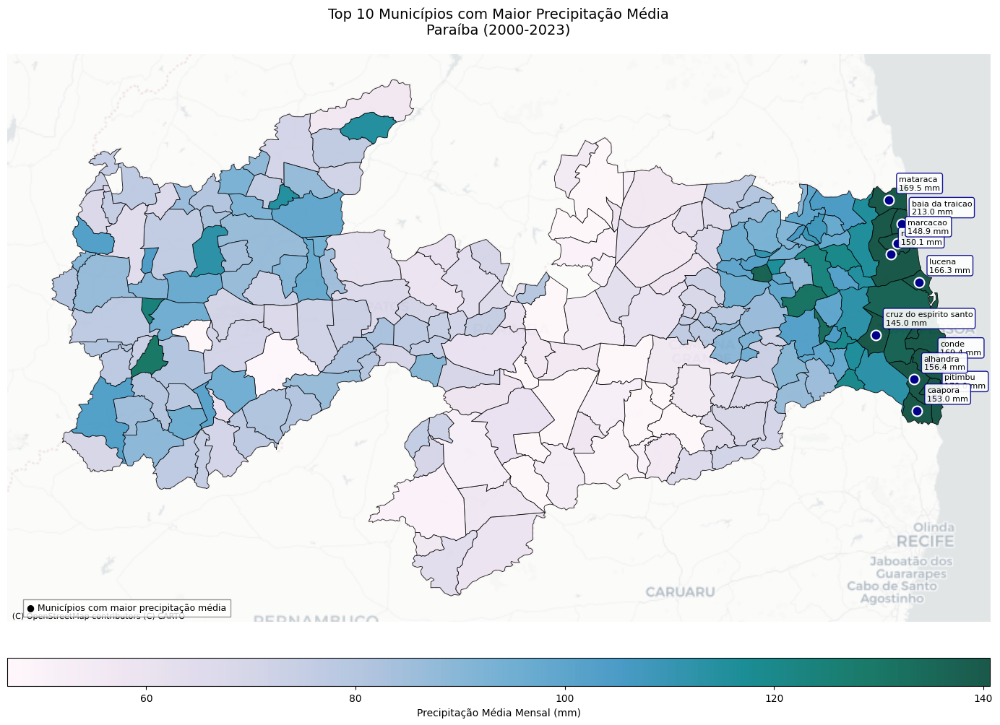

In [38]:
df_precip = df_mensal.groupby('municipio', as_index=False)['precipitacao_acumulada'].mean()
gdf_precip = geojson.merge(df_precip, left_on='name', right_on='municipio')
gdf_precip = gdf_precip.to_crs(epsg=3857)

top10 = gdf_precip.nlargest(10, 'precipitacao_acumulada')

fig, ax = plt.subplots(figsize=(14, 12))

plot = gdf_precip.plot(
    column='precipitacao_acumulada',
    cmap='PuBuGn',
    linewidth=0.6,
    edgecolor='black',
    alpha=0.9,
    ax=ax,
    vmin=gdf_precip['precipitacao_acumulada'].quantile(0.05),  
    vmax=gdf_precip['precipitacao_acumulada'].quantile(0.95),  
    legend=False  
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.5)
fig.colorbar(
    plot.get_children()[0],
    cax=cax,
    orientation='horizontal',
    label='Precipitação Média Mensal (mm)'
)

for idx, row in top10.iterrows():
    ax.scatter(
        x=row.geometry.centroid.x,
        y=row.geometry.centroid.y,
        color='darkblue',
        s=100,
        edgecolor='white',
        linewidth=1.5,
        marker='o',
        label='Top 10' if idx == 0 else ""  
    )
    ax.annotate(
        text=f"{row['municipio']}\n{row['precipitacao_acumulada']:.1f} mm",
        xy=(row.geometry.centroid.x, row.geometry.centroid.y),
        xytext=(10, 10),
        textcoords="offset points",
        fontsize=8,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="darkblue", alpha=0.9)
    )

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    alpha=0.7
)

ax.set_title(
    "Municípios com Maior Precipitação Média\nParaíba (2000-2023)",
    fontsize=14,
    pad=20
)

ax.text(
    0.02, 0.02,
    "● Municípios com maior precipitação média",
    transform=ax.transAxes,
    fontsize=9,
    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray')
)

ax.set_axis_off()
plt.tight_layout()
# plt.savefig("analises/mapa_precipitacao_top10.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
df_precip = df_mensal.groupby('municipio', as_index=False)['precipitacao_acumulada'].mean()
gdf_precip = geojson.merge(df_precip, left_on='name', right_on='municipio')
gdf_precip = gdf_precip.to_crs(epsg=3857)  # Projeção Web Mercator

fig, ax = plt.subplots(figsize=(14, 10))

plot = gdf_precip.plot(
    column='precipitacao_acumulada',
    cmap='YlGnBu',  
    linewidth=0.5,
    edgecolor='black',
    alpha=0.9,
    ax=ax,
    vmin=gdf_precip['precipitacao_acumulada'].quantile(0.05),  #
    vmax=gdf_precip['precipitacao_acumulada'].quantile(0.95),  os
    missing_kwds={'color': 'lightgrey'} 
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.1)
fig.colorbar(plot.get_children()[0], cax=cax, orientation='horizontal',
             label='Precipitação Média Mensal (mm)')

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, alpha=0.7)

ax.set_title("Distribuição Espacial da Precipitação Média\nEstado da Paraíba (2000-2023)", 
             fontsize=14, pad=20)
ax.set_axis_off()

top_municipio = gdf_precip.nlargest(1, 'precipitacao_acumulada')
ax.scatter(top_municipio.geometry.centroid.x, top_municipio.geometry.centroid.y, 
           color='red', s=50, label=f'Maior precipitação: {top_municipio["municipio"].values[0]}')
ax.legend(loc='upper right')

plt.tight_layout()
# plt.savefig("analises/mapa_precipitacao_aprimorado.png", dpi=300, bbox_inches="tight")
plt.show()

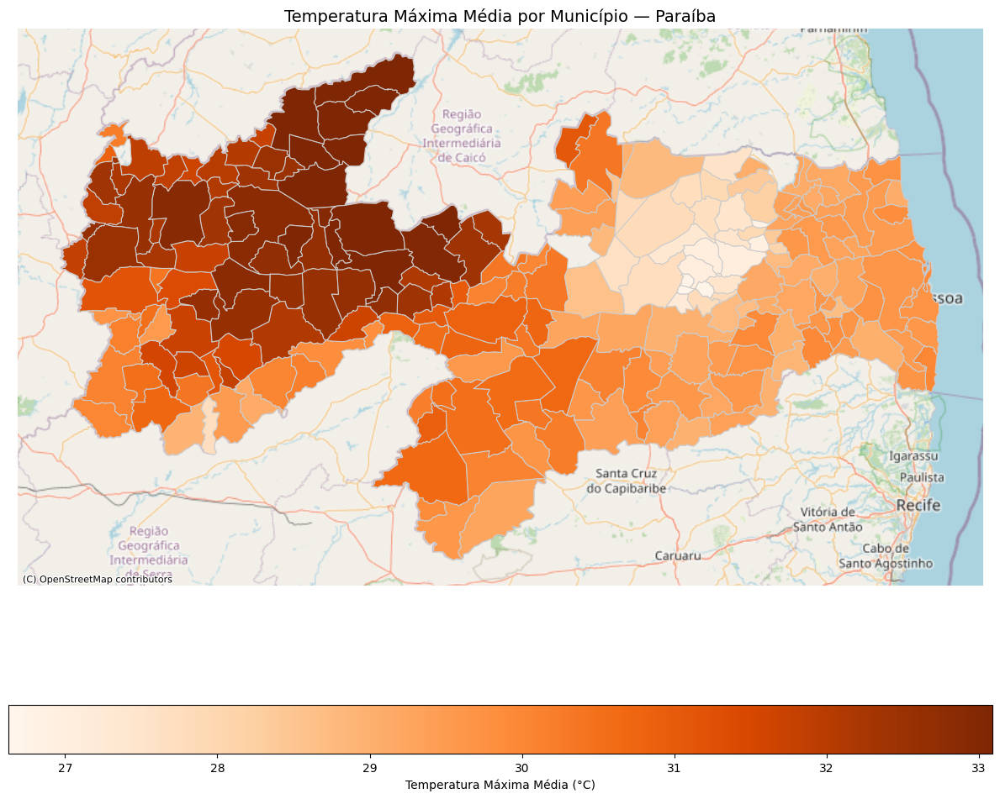

In [102]:
df_temp_max = df_mensal.groupby('municipio', as_index=False)['temperatura_max_C'].mean()
gdf_temp_max = geojson.merge(df_temp_max, left_on='name', right_on='municipio')
gdf_temp_max = gdf_temp_max.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 10))
gdf_temp_max.plot(
    column='temperatura_max_C',
    cmap='Oranges',
    linewidth=0.8,
    edgecolor='0.8',
    legend=True,
    ax=ax,
    vmin=gdf_temp_max['temperatura_max_C'].min(),
    vmax=gdf_temp_max['temperatura_max_C'].quantile(0.95),
    legend_kwds={'label': "Temperatura Máxima Média (°C)", 'orientation': "horizontal"}
)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=gdf_temp_max.crs.to_string())
ax.set_title("Temperatura Máxima Média por Município — Paraíba", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
# plt.savefig("analises/mapa-temp-max.png", bbox_inches="tight")
plt.show()


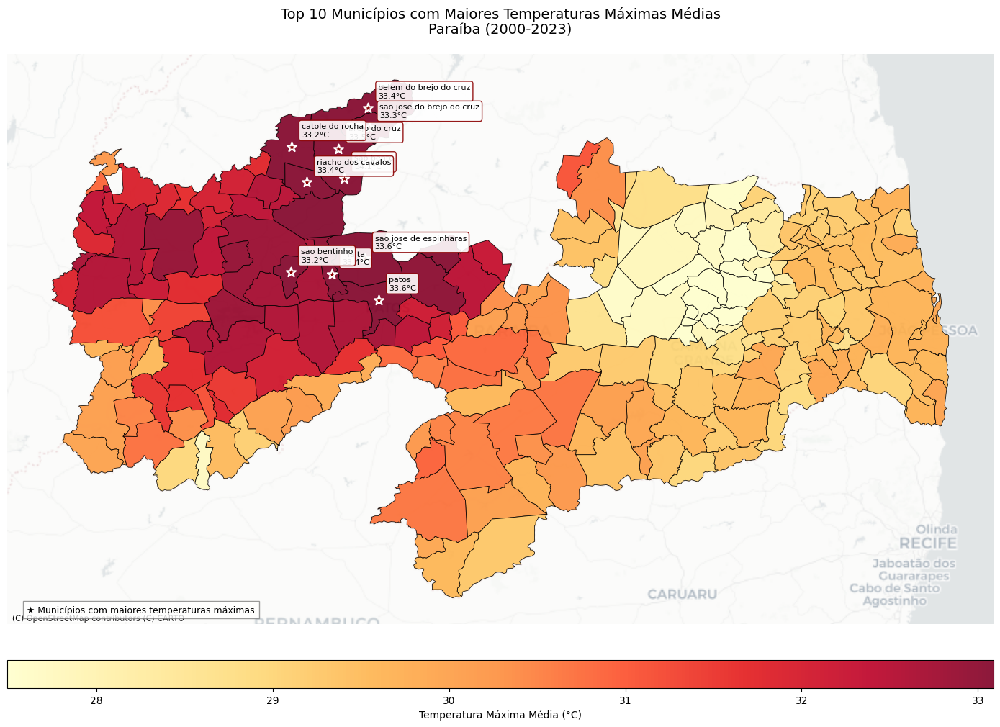

In [39]:
df_temp_max = df_mensal.groupby('municipio', as_index=False)['temperatura_max_C'].mean()
gdf_temp_max = geojson.merge(df_temp_max, left_on='name', right_on='municipio')
gdf_temp_max = gdf_temp_max.to_crs(epsg=3857)

top10_hot = gdf_temp_max.nlargest(10, 'temperatura_max_C')

fig, ax = plt.subplots(figsize=(14, 12))

plot = gdf_temp_max.plot(
    column='temperatura_max_C',
    cmap='YlOrRd',  
    linewidth=0.6,
    edgecolor='black',
    alpha=0.9,
    ax=ax,
    vmin=gdf_temp_max['temperatura_max_C'].quantile(0.05),  
    vmax=gdf_temp_max['temperatura_max_C'].quantile(0.95),  
    legend=False  
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.5)
fig.colorbar(
    plot.get_children()[0],
    cax=cax,
    orientation='horizontal',
    label='Temperatura Máxima Média (°C)'
)

# 5. Destacar os 10 municípios mais quentes
for idx, row in top10_hot.iterrows():
    ax.scatter(
        x=row.geometry.centroid.x,
        y=row.geometry.centroid.y,
        color='darkred',
        s=100,
        edgecolor='white',
        linewidth=1.5,
        marker='*',
        label='Top 10' if idx == 0 else ""  # Evita repetição na legenda
    )
    ax.annotate(
        text=f"{row['municipio']}\n{row['temperatura_max_C']:.1f}°C",
        xy=(row.geometry.centroid.x, row.geometry.centroid.y),
        xytext=(10, 10),
        textcoords="offset points",
        fontsize=8,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="darkred", alpha=0.9)
    )

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    alpha=0.7
)

ax.set_title(
    "Top 10 Municípios com Maiores Temperaturas Máximas Médias\nParaíba (2000-2023)",
    fontsize=14,
    pad=20
)

ax.text(
    0.02, 0.02,
    "★ Municípios com maiores temperaturas máximas",
    transform=ax.transAxes,
    fontsize=9,
    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray')
)

ax.set_axis_off()
plt.tight_layout()
# plt.savefig("analises/mapa_temp_max_top10.png", dpi=300, bbox_inches="tight")
plt.show()

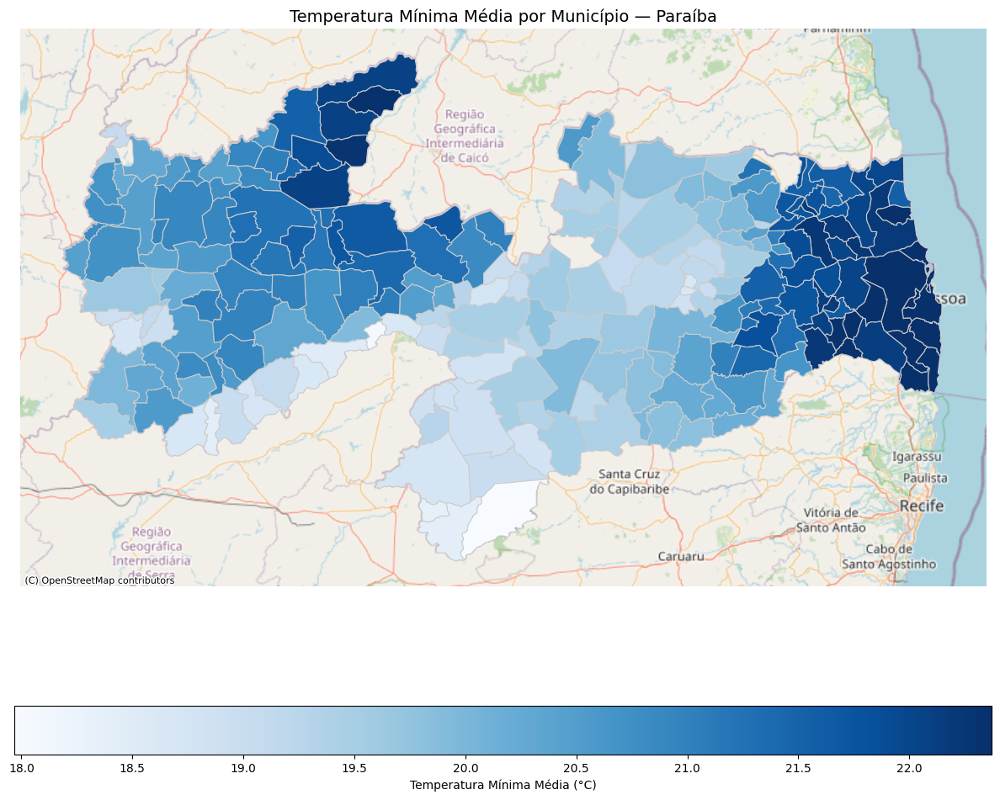

In [103]:
df_temp_min = df_mensal.groupby('municipio', as_index=False)['temperatura_min_C'].mean()
gdf_temp_min = geojson.merge(df_temp_min, left_on='name', right_on='municipio')
gdf_temp_min = gdf_temp_min.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 10))
gdf_temp_min.plot(
    column='temperatura_min_C',
    cmap='Blues',
    linewidth=0.8,
    edgecolor='0.8',
    legend=True,
    ax=ax,
    vmin=gdf_temp_min['temperatura_min_C'].min(),
    vmax=gdf_temp_min['temperatura_min_C'].quantile(0.95),
    legend_kwds={'label': "Temperatura Mínima Média (°C)", 'orientation': "horizontal"}
)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=gdf_temp_min.crs.to_string())
ax.set_title("Temperatura Mínima Média por Município — Paraíba", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
# plt.savefig("analises/mapa-temp-min.png", bbox_inches="tight")
plt.show()


In [83]:
gdf_merged.columns

Index(['id', 'name', 'description', 'geometry', 'municipio',
       'incidencia_doenca'],
      dtype='object')

C:\Users\mauri\AppData\Local\Temp\ipykernel_19404\987885621.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  x=gdf_merged2.geometry.centroid.x,
C:\Users\mauri\AppData\Local\Temp\ipykernel_19404\987885621.py:37: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  y=gdf_merged2.geometry.centroid.y,
C:\Users\mauri\miniconda3\envs\data-clima\lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 25 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


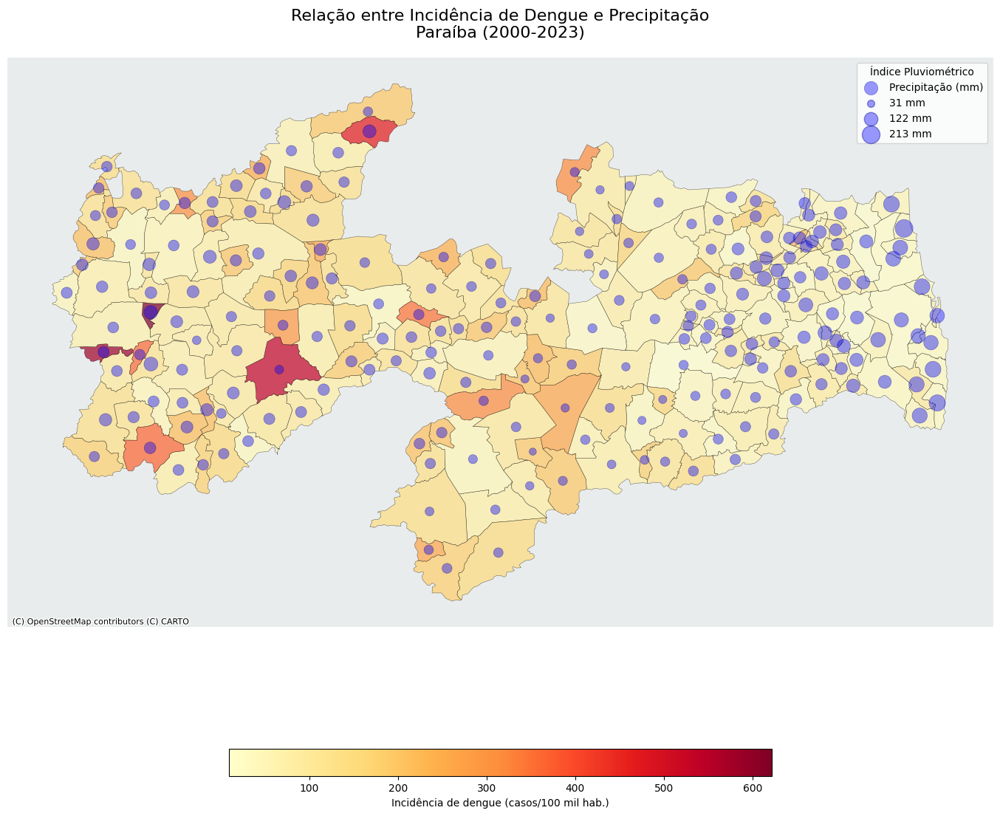

In [84]:
df_media_sobre = (
    df_mensal
    .groupby('municipio', as_index=False)
    .agg({
        'incidencia_doenca': 'mean',
        'precipitacao_acumulada': 'mean'
    })
)

gdf_merged2 = geojson.merge(df_media_sobre, left_on='name', right_on='municipio')


fig, ax = plt.subplots(figsize=(15, 12))

gdf_merged2.plot(
    column='incidencia_doenca',
    cmap='YlOrRd',
    legend=True,
    ax=ax,
    alpha=0.7,
    edgecolor='black',
    linewidth=0.3,
    legend_kwds={
        'label': "Incidência de dengue (casos/100 mil hab.)",
        'shrink': 0.5,
        'orientation': "horizontal"
    }
)

precip_norm = 50 + 250 * (gdf_merged2['precipitacao_acumulada'] - gdf_merged2['precipitacao_acumulada'].min()) / (gdf_merged2['precipitacao_acumulada'].max() - gdf_merged2['precipitacao_acumulada'].min())

scatter = ax.scatter(
    x=gdf_merged2.geometry.centroid.x,
    y=gdf_merged2.geometry.centroid.y,
    s=precip_norm,
    c='blue',
    alpha=0.4,
    edgecolor='darkblue',
    linewidth=0.5,
    label='Precipitação (mm)'
)

min_rain = gdf_merged2['precipitacao_acumulada'].min()
max_rain = gdf_merged2['precipitacao_acumulada'].max()
mid_rain = (min_rain + max_rain) / 2

for rain, label in zip([min_rain, mid_rain, max_rain], [f"{min_rain:.0f} mm", f"{mid_rain:.0f} mm", f"{max_rain:.0f} mm"]):
    ax.scatter([], [], s=50 + 250*(rain - min_rain)/(max_rain - min_rain), 
               c='blue', alpha=0.4, edgecolor='darkblue', label=label)

ax.legend(loc='upper right', title="Índice Pluviométrico")

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, alpha=0.5)
ax.set_title("Relação entre Incidência de Dengue e Precipitação\nParaíba (2000-2023)", fontsize=16, pad=20)
ax.set_axis_off()

plt.tight_layout()
# plt.savefig("mapa_incidencia_chuva.png", dpi=300, bbox_inches="tight")
plt.show()

In [93]:
limites_chuva = [0, 50, 100, 200, np.inf]  # em mm
limites_temp_max = [0, 28, 32, 35, np.inf]  # em °C
limites_temp_min = [0, 20, 24, np.inf]      # em °C

df_analise = df_mensal.copy()

chuva_cats = pd.CategoricalDtype(
    categories=['Muito Baixa', 'Baixa', 'Moderada', 'Alta'],
    ordered=True
)

temp_cats = pd.CategoricalDtype(
    categories=['Ameno', 'Quente', 'Muito Quente', 'Extremo'],
    ordered=True
)

df_analise['faixa_chuva'] = pd.cut(
    df_analise['precipitacao_acumulada'],
    bins=[0, 50, 100, 200, np.inf],
    labels=chuva_cats.categories,
    right=False
).astype(chuva_cats)

df_analise['faixa_temp_max'] = pd.cut(
    df_analise['temperatura_max_C'],
    bins=[0, 28, 32, 35, np.inf],
    labels=temp_cats.categories,
    right=False
).astype(temp_cats)

tabela_analise = df_analise.groupby(
    ['faixa_chuva', 'faixa_temp_max'], 
    # as_index=False,
    observed=True  # ← Corrige o warning
).agg({
    'numero_casos': ['sum', 'mean', 'count'],
    'incidencia_doenca': ['mean', 'max'],
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean'
}).reset_index()

tabela_analise.columns = [
    'Faixa de Chuva',
    'Faixa Temp. Máxima',
    'Casos Totais',
    'Média Casos Mensais',
    'Meses Observados',
    'Incidência Média',
    'Incidência Máxima',
    'Precipitação Média (mm)',
    'Temp. Máxima Média (°C)'
]

total_casos = tabela_analise['Casos Totais'].sum()
tabela_analise['% do Total'] = (tabela_analise['Casos Totais'] / total_casos * 100).round(1)
tabela_analise['Razão Casos/Mês'] = (tabela_analise['Média Casos Mensais'] / tabela_analise['Meses Observados']).round(1)

tabela_analise = tabela_analise.sort_values(['Incidência Média', 'Casos Totais'], ascending=[False, False])

tabela_final = tabela_analise[[
    'Faixa de Chuva',
    'Faixa Temp. Máxima',
    'Meses Observados',
    'Casos Totais',
    '% do Total',
    'Média Casos Mensais',
    'Incidência Média',
    'Precipitação Média (mm)',
    'Temp. Máxima Média (°C)'
]]

(tabela_final.style
 .background_gradient(subset=['Incidência Média', '% do Total'], cmap='YlOrRd')
 .format({
     'Média Casos Mensais': '{:.1f}',
     'Incidência Média': '{:.1f}',
     'Precipitação Média (mm)': '{:.1f}',
     'Temp. Máxima Média (°C)': '{:.1f}',
     '% do Total': '{:.1f}%'
 }))

,Faixa de Chuva,Faixa Temp. Máxima,Meses Observados,Casos Totais,% do Total,Média Casos Mensais,Incidência Média,Precipitação Média (mm),Temp. Máxima Média (°C)
15,Alta,Extremo,14,922,0.3%,65.9,303.4,230.9,35.1
11,Moderada,Extremo,56,2002,0.6%,35.8,251.9,138.6,35.2
14,Alta,Muito Quente,323,6570,2.0%,20.3,159.9,255.8,32.5
6,Baixa,Muito Quente,733,18369,5.5%,25.1,159.2,71.8,32.7
10,Moderada,Muito Quente,734,14503,4.3%,19.8,145.9,143.2,32.5
5,Baixa,Quente,2535,56097,16.7%,22.1,118.6,73.0,29.6
9,Moderada,Quente,2308,52122,15.5%,22.6,113.8,142.6,29.7
2,Muito Baixa,Muito Quente,2789,34254,10.2%,12.3,104.4,12.8,32.7
13,Alta,Quente,1316,55870,16.6%,42.5,94.5,286.7,29.4
7,Baixa,Extremo,110,1348,0.4%,12.3,88.1,71.9,35.3


In [9]:
df_clima_media = df_mensal.groupby('municipio', as_index=False)[
    ['media_ponderada_temperatura_max', 'media_ponderada_temperatura_min', 'media_ponderada_precipitacao', 'precipitacao_acumulada', 'temperatura_max_C',
       'temperatura_min_C', 'populacao']
].mean()

In [10]:
top_temp_max = df_clima_media.sort_values(by='temperatura_max_C', ascending=False).head(10)
print("🌡️ Top 10 cidades mais quentes (Temperatura Máxima Média):")
print(top_temp_max[['municipio', 'temperatura_max_C']])

🌡️ Top 10 cidades mais quentes (Temperatura Máxima Média):
                     municipio  temperatura_max_C
188                  São Bento          34.100000
194     São José de Espinharas          33.642105
133                      Patos          33.630435
34               Brejo do Cruz          33.480000
157         Riacho dos Cavalos          33.408602
25      Belém do Brejo do Cruz          33.389610
106                      Malta          33.352941
198  São José do Brejo do Cruz          33.258065
187               São Bentinho          33.243902
54             Catolé do Rocha          33.227468


In [98]:
top_temp_min_baixa = df_clima_media.sort_values(by='temperatura_min_C').head(10)
print("🧊 Top 10 cidades mais frias (Temperatura Mínima Média):")
print(top_temp_min_baixa[['municipio', 'temperatura_min_C']])


🧊 Top 10 cidades mais frias (Temperatura Mínima Média):
                      municipio  temperatura_min_C
182           sao joao do tigre          17.966667
118                    matureia          18.054545
222                      zabele          18.357143
196  sao sebastiao do umbuzeiro          18.428571
187        sao jose de princesa          18.442308
85                    imaculada          18.505747
15                       areial          18.621622
214                    teixeira          18.623656
0                   agua branca          18.628319
120                    montadas          18.641026


In [100]:
top_precip = df_clima_media.sort_values(by='precipitacao_acumulada', ascending=False).head(10)
print("🌧️ Top 10 cidades com maior precipitação média:")
print(top_precip[['municipio', 'precipitacao_acumulada']])

🌧️ Top 10 cidades com maior precipitação média:
                  municipio  precipitacao_acumulada
18          baia da traicao              213.000000
146                 pitimbu              178.978723
115                mataraca              169.530612
59                    conde              169.411765
106                  lucena              166.285714
7                  alhandra              156.415254
37                  caapora              152.988764
162               rio tinto              150.056180
111                marcacao              148.878788
63   cruz do espirito santo              145.025000


In [105]:
bottom_precip = df_clima_media.sort_values(by='precipitacao_acumulada').head(10)
print("🔥 Top 10 cidades com menor precipitação média:")
print(bottom_precip[['municipio', 'precipitacao_acumulada']])

🔥 Top 10 cidades com menor precipitação média:
              municipio  precipitacao_acumulada
62             coxixola               30.763158
56             caturite               41.496503
132              parari               41.562500
33            boqueirao               41.640288
22     barra de santana               41.948980
180  sao joao do cariri               43.618182
141               picui               43.787330
29            boa vista               44.114504
96          juazeirinho               44.358824
60                congo               45.054795


## Municípios Pequenos no Top 10 de Incidência

In [40]:
# Filtrar municípios com população significativa (ex.: >10k hab)
df_filtrado = df_mensal[df_mensal['populacao'] > 10000]

# Nova análise só com municípios maiores
top10_ajustado = (df_filtrado.groupby('municipio')
                 .agg({'incidencia_doenca':'mean', 'populacao':'first'})
                 .nlargest(10, 'incidencia_doenca'))

In [41]:
# Verificar correlação entre população e incidência
corr, p_val = stats.pearsonr(np.log10(df_mensal['populacao']), 
                            df_mensal['incidencia_doenca'])
print(f"Correlação (log pop. vs incidência): r = {corr:.2f}, p = {p_val:.4f}")

Correlação (log pop. vs incidência): r = -0.16, p = 0.0000


In [42]:
# Criar categorias de precipitação
bins = [0, 40, 100, 150, 300, np.inf]
labels = ['<40mm', '40-100mm', '100-150mm', '150-300mm', '>300mm']
df_mensal['precip_cat'] = pd.cut(df_mensal['precipitacao_acumulada'], bins=bins, labels=labels)

# Calcular incidência média por categoria
(df_mensal.groupby('precip_cat')
          ['incidencia_doenca']
          .agg(['mean', 'std', 'count'])
          .sort_values('mean', ascending=False))

C:\Users\mauri\AppData\Local\Temp\ipykernel_15896\3669859768.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  (df_mensal.groupby('precip_cat')


,mean,std,count
precip_cat,,,
40-100mm,117.912230,295.757113,5289
100-150mm,116.934454,318.405014,2376
150-300mm,107.232122,305.718775,2897
>300mm,85.734886,193.276910,519
<40mm,84.049753,248.761943,6652


In [38]:
df_mensal.columns

Index(['codigo_municipio', 'ano', 'mes', 'numero_casos', 'populacao',
       'data_registro', 'precipitacao_acumulada', 'temperatura_max_C',
       'temperatura_min_C', 'data_reg_clima', 'municipio', 'estado',
       'nome_regiao', 'area_km2', 'longitude', 'latitude',
       'media_ponderada_temperatura_max', 'media_ponderada_temperatura_min',
       'media_ponderada_precipitacao', 'incidencia_doenca', 'temp_media'],
      dtype='object')

In [60]:
df_agg = df_mensal.groupby('codigo_municipio').agg({
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean',
    'numero_casos': 'sum',
    'populacao': 'mean',  
    'incidencia_doenca': 'mean',
    'municipio': 'first',
    'estado': 'first'
}).reset_index()

df_agg['incidencia_agregada'] = df_agg['numero_casos'] / df_agg['populacao'] * 100000  # por 100 mil hab

In [40]:
X = df_agg[['precipitacao_acumulada', 'temperatura_max_C']]
y = df_agg['incidencia_agregada']

model = LinearRegression()
model.fit(X, y)

print("Intercepto:", model.intercept_)
print("Coeficiente para precipitação:", model.coef_[0])
print("Coeficiente para temperatura máxima:", model.coef_[1])


r2 = model.score(X, y)
print("R² do modelo:", r2)

y_pred = model.predict(X)

Intercepto: -17623.04257773304
Coeficiente para precipitação: -64.8580061155284
Coeficiente para temperatura máxima: 1045.9665294636343
R² do modelo: 0.18651073703819832


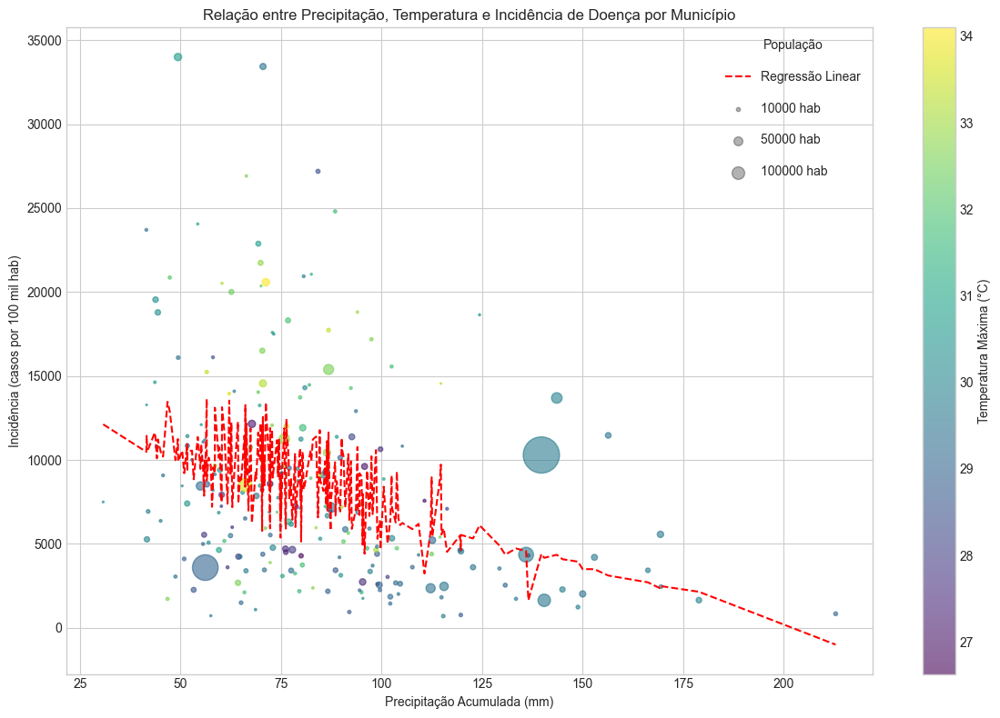

In [61]:
plt.figure(figsize=(12, 8))

scatter = plt.scatter(
    x=df_agg['precipitacao_acumulada'],
    y=df_agg['incidencia_agregada'],
    c=df_agg['temperatura_max_C'],
    s=df_agg['populacao']/1000,  
    alpha=0.6,
    cmap='viridis'
)

sorted_idx = np.argsort(X.iloc[:, 0])
plt.plot(X.iloc[sorted_idx, 0], y_pred[sorted_idx], 'r--', label='Regressão Linear')

plt.colorbar(scatter, label='Temperatura Máxima (°C)')
plt.xlabel('Precipitação Acumulada (mm)')
plt.ylabel('Incidência (casos por 100 mil hab)')
plt.title('Relação entre Precipitação, Temperatura e Incidência de Doença por Município')

for area in [10000, 50000, 100000]:
    plt.scatter([], [], c='k', alpha=0.3, s=area/1000, label=str(area) + ' hab')
plt.legend(title='População', labelspacing=1.5)

plt.grid(True)
plt.tight_layout()
# plt.savefig("analises/correlacao.png", bbox_inches="tight")
plt.show()

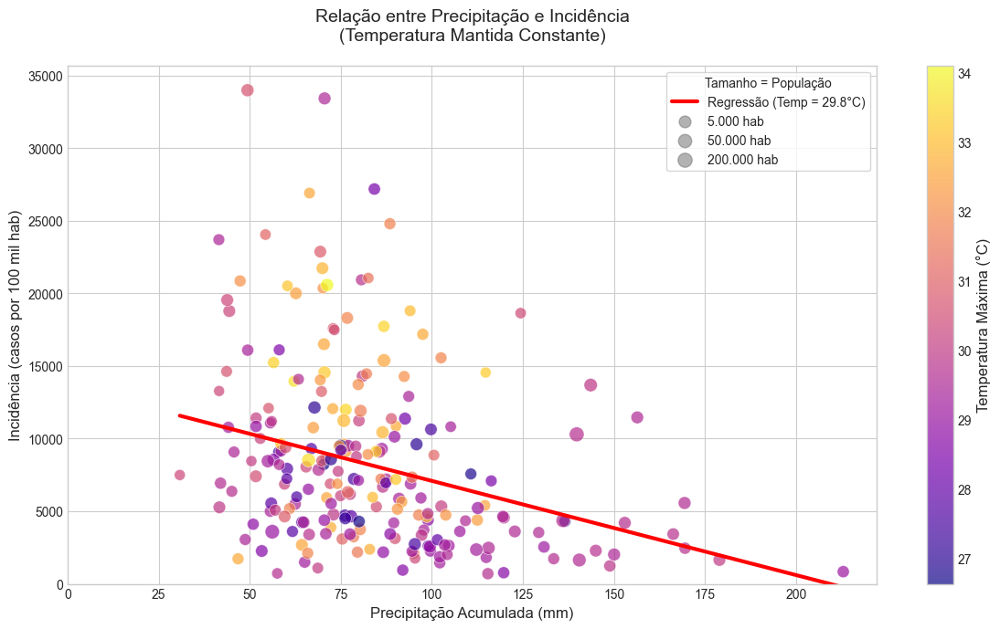

In [45]:
temp_referencia = df_agg['temperatura_max_C'].median()  

x_vals = np.linspace(df_agg['precipitacao_acumulada'].min(), 
                     df_agg['precipitacao_acumulada'].max(), 100)
y_pred_const = model.intercept_ + model.coef_[0]*x_vals + model.coef_[1]*temp_referencia

plt.figure(figsize=(12, 7))
plt.style.use('seaborn-v0_8-whitegrid')  

scatter = plt.scatter(
    x=df_agg['precipitacao_acumulada'],
    y=df_agg['incidencia_agregada'],
    c=df_agg['temperatura_max_C'],
    s=np.log(df_agg['populacao'])*10,  
    alpha=0.7,
    cmap='plasma',
    edgecolor='w',
    linewidth=0.5
)

reg_line = plt.plot(
    x_vals, 
    y_pred_const,
    'r-',
    linewidth=3,
    label=f'Regressão (Temp = {temp_referencia:.1f}°C)'
)

# Elementos gráficos
cbar = plt.colorbar(scatter)
cbar.set_label('Temperatura Máxima (°C)', fontsize=12)
cbar.ax.tick_params(labelsize=10)

plt.xlabel('Precipitação Acumulada (mm)', fontsize=12)
plt.ylabel('Incidência (casos por 100 mil hab)', fontsize=12)
plt.title('Relação entre Precipitação e Incidência\n(Temperatura Mantida Constante)', 
          fontsize=14, pad=20)

pop_vals = [5000, 50000, 200000] 
for pop in pop_vals:
    plt.scatter([], [], c='gray', alpha=0.6, s=np.log(pop)*10, 
                label=f'{pop:,} hab'.replace(',', '.'))
plt.legend(title='Tamanho = População', frameon=True)

plt.xlim(left=0)
plt.ylim(bottom=0)
plt.tight_layout()
plt.show()

In [52]:
df_ano = df_mensal.groupby(['codigo_municipio', 'ano']).agg({
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean',
    'numero_casos': 'sum',
    'populacao': 'mean'
}).reset_index()

In [170]:
df_ano = df_mensal.groupby(['municipio', 'ano']).agg({
    'numero_casos': 'sum',
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean'
}).reset_index()

cidade = 'joao pessoa'
df_cidade = df_ano[df_ano['municipio'] == cidade]

X = df_cidade[['precipitacao_acumulada', 'temperatura_max_C']]
y = df_cidade['numero_casos']

X = sm.add_constant(X)

modelo_ano = sm.OLS(y, X).fit()

print(modelo_ano.summary())

                            OLS Regression Results                            
Dep. Variable:           numero_casos   R-squared:                       0.496
Model:                            OLS   Adj. R-squared:                  0.448
Method:                 Least Squares   F-statistic:                     10.32
Date:                Sat, 03 May 2025   Prob (F-statistic):           0.000757
Time:                        20:56:48   Log-Likelihood:                -220.63
No. Observations:                  24   AIC:                             447.3
Df Residuals:                      21   BIC:                             450.8
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                  -1.56

In [59]:
df_ano = df_mensal.groupby(['municipio', 'ano']).agg({
    'numero_casos': 'sum',
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean'
}).reset_index()



X = df_ano[['precipitacao_acumulada', 'temperatura_max_C']]
y = df_ano['numero_casos']

X = sm.add_constant(X)

modelo_ano = sm.OLS(y, X).fit()

print(modelo_ano.summary())

                            OLS Regression Results                            
Dep. Variable:           numero_casos   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     4.338
Date:                Sat, 03 May 2025   Prob (F-statistic):             0.0131
Time:                        00:14:37   Log-Likelihood:                -29169.
No. Observations:                3915   AIC:                         5.834e+04
Df Residuals:                    3912   BIC:                         5.836e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                   -183

In [44]:
df_ano_pb = df_mensal.groupby(['ano']).agg({
    'numero_casos': 'sum',
    'precipitacao_acumulada': 'mean',
    'temperatura_max_C': 'mean'
}).reset_index()

X = df_ano[['precipitacao_acumulada', 'temperatura_max_C']]
y = df_ano['numero_casos']

X = sm.add_constant(X)

modelo_ano = sm.OLS(y, X).fit()

print(modelo_ano.summary())

                            OLS Regression Results                            
Dep. Variable:           numero_casos   R-squared:                       0.192
Model:                            OLS   Adj. R-squared:                  0.115
Method:                 Least Squares   F-statistic:                     2.490
Date:                Thu, 01 May 2025   Prob (F-statistic):              0.107
Time:                        18:35:23   Log-Likelihood:                -253.10
No. Observations:                  24   AIC:                             512.2
Df Residuals:                      21   BIC:                             515.7
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                  -2.04

In [61]:
cidade = 'Olho d\'Água'
df_cidade = df_ano[df_ano['municipio'] == cidade]

X = df_cidade[['precipitacao_acumulada', 'temperatura_max_C']]
y = df_cidade['numero_casos']

X = sm.add_constant(X)

modelo_olhodagua = sm.OLS(y, X).fit()
print(modelo_olhodagua.summary())

                            OLS Regression Results                            
Dep. Variable:           numero_casos   R-squared:                       0.454
Model:                            OLS   Adj. R-squared:                  0.333
Method:                 Least Squares   F-statistic:                     3.747
Date:                Sat, 03 May 2025   Prob (F-statistic):             0.0655
Time:                        00:20:34   Log-Likelihood:                -76.983
No. Observations:                  12   AIC:                             160.0
Df Residuals:                       9   BIC:                             161.4
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                   3568

C:\Users\mauri\miniconda3\envs\data-clima\lib\site-packages\scipy\stats\_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=12 observations were given.
  return hypotest_fun_in(*args, **kwds)


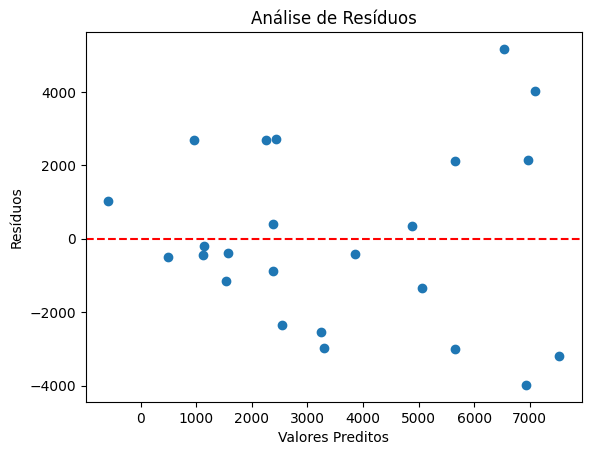

In [53]:
plt.scatter(modelo_ano.fittedvalues, modelo_ano.resid)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Valores Preditos')
plt.ylabel('Resíduos')
plt.title('Análise de Resíduos')
plt.show()